# **Importing Packages**

In [65]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import warnings
warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)

# **Loading Dataset and Data Preparation**

In [66]:
df = pd.read_csv('E:/Assignments/Unsupervisied/Data/AEP_hourly/AEP_hourly.csv', parse_dates=['Datetime'],index_col='Datetime').sort_values('Datetime')

In [67]:
df.head(10)

,AEP_MW
Datetime,
2004-10-01 01:00:00,12379
2004-10-01 02:00:00,11935
2004-10-01 03:00:00,11692
2004-10-01 04:00:00,11597
2004-10-01 05:00:00,11681
2004-10-01 06:00:00,12280
2004-10-01 07:00:00,13692
2004-10-01 08:00:00,14618
2004-10-01 09:00:00,14903


In [68]:
df.describe

<bound method NDFrame.describe of                      AEP_MW
Datetime                   
2004-10-01 01:00:00   12379
2004-10-01 02:00:00   11935
2004-10-01 03:00:00   11692
2004-10-01 04:00:00   11597
2004-10-01 05:00:00   11681
...                     ...
2018-08-02 20:00:00   17673
2018-08-02 21:00:00   17303
2018-08-02 22:00:00   17001
2018-08-02 23:00:00   15964
2018-08-03 00:00:00   14809

[121273 rows x 1 columns]>

In [69]:
df.isnull().sum()

AEP_MW    0
dtype: int64

In [70]:
df['Date'] = df.index.date
df['Hour'] = df.index.hour

In [71]:
df.head()

,AEP_MW,Date,Hour
Datetime,,,
2004-10-01 01:00:00,12379,2004-10-01,1
2004-10-01 02:00:00,11935,2004-10-01,2
2004-10-01 03:00:00,11692,2004-10-01,3
2004-10-01 04:00:00,11597,2004-10-01,4
2004-10-01 05:00:00,11681,2004-10-01,5


# **Feature Engineering**

### Creating a pivot table column for each hour per day

In [72]:
pivot_df = df.pivot_table(values='AEP_MW', index='Date', columns='Hour')

In [73]:
pivot_df.head()

Hour,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
Date,,,,,,,,,,,,,,,,,,,,,
2004-10-01,NaN,12379.0,11935.0,11692.0,11597.0,11681.0,12280.0,13692.0,14618.0,14903.0,...,15655.0,15739.0,15739.0,15644.0,15353.0,15034.0,15211.0,15349.0,14837.0,14067.0
2004-10-02,13147.0,12260.0,11672.0,11352.0,11177.0,11142.0,11331.0,11866.0,12387.0,13144.0,...,13934.0,13758.0,13579.0,13620.0,13483.0,13379.0,13825.0,14056.0,14015.0,12940.0
2004-10-03,12172.0,11443.0,10807.0,10600.0,10438.0,10430.0,10509.0,10795.0,11288.0,11965.0,...,12924.0,12759.0,12605.0,12755.0,12795.0,12979.0,13819.0,14237.0,13878.0,13132.0
2004-10-04,12351.0,11817.0,11408.0,11261.0,11247.0,11414.0,12283.0,13862.0,14864.0,15046.0,...,15803.0,15747.0,15689.0,15617.0,15441.0,15368.0,15910.0,16133.0,15583.0,14497.0
2004-10-05,13405.0,12532.0,12126.0,11926.0,11914.0,12010.0,12770.0,14393.0,15444.0,15547.0,...,15450.0,15259.0,15107.0,15101.0,14984.0,14976.0,15649.0,16007.0,15469.0,14520.0


### Checking is there are null values

In [74]:
pivot_df.isnull().sum()

Hour
0      2
1      1
2     11
3     15
4      2
5      1
6      1
7      1
8      1
9      1
10     1
11     1
12     1
13     1
14     2
15     1
16     1
17     1
18     1
19     1
20     1
21     1
22     1
23     1
dtype: int64

### Interpolate the missing values

In [75]:
pivot_df = pivot_df.apply(lambda row: row.interpolate(method='linear'), axis=1)

In [76]:
pivot_df.isnull().sum()

Hour
0     2
1     0
2     0
3     0
4     0
5     0
6     0
7     0
8     0
9     0
10    0
11    0
12    0
13    0
14    0
15    0
16    0
17    0
18    0
19    0
20    0
21    0
22    0
23    0
dtype: int64

### Removing the rest of the NaN values with mean imputation

In [77]:
pivot_df = pivot_df.apply(lambda x: x.fillna(x.mean()), axis=0)

In [78]:
pivot_df.isnull().sum()

Hour
0     0
1     0
2     0
3     0
4     0
5     0
6     0
7     0
8     0
9     0
10    0
11    0
12    0
13    0
14    0
15    0
16    0
17    0
18    0
19    0
20    0
21    0
22    0
23    0
dtype: int64

### Plotting the average energy consumption per hour

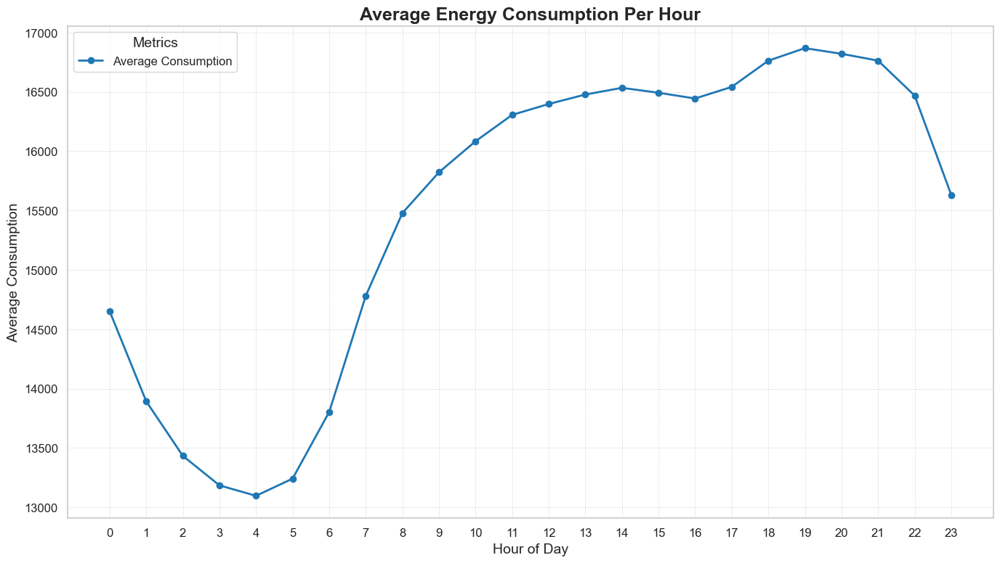

In [79]:
# Calculate average energy consumption per hour
hourly_avg = pivot_df.mean(axis=0)

main_color = plt.get_cmap('tab20').colors[0]
sns.set_theme(style="whitegrid", palette="tab20", font_scale=1.2)
plt.figure(figsize=(14, 8))
plt.plot(
    hourly_avg.index, 
    hourly_avg.values, 
    color=main_color,      
    linewidth=2,            
    marker='o',              
    markersize=6,              
    label='Average Consumption'
)
plt.title('Average Energy Consumption Per Hour', fontsize=18, fontweight='bold')
plt.xlabel('Hour of Day', fontsize=14)
plt.ylabel('Average Consumption', fontsize=14)
plt.xticks(hourly_avg.index, fontsize=12)  # Ensure x-ticks match the hours
plt.yticks(fontsize=12)
plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
plt.legend(title='Metrics', title_fontsize=14, fontsize=12)
plt.tight_layout()
plt.show()

# **Data Normalization**

### Understanding the data outliers

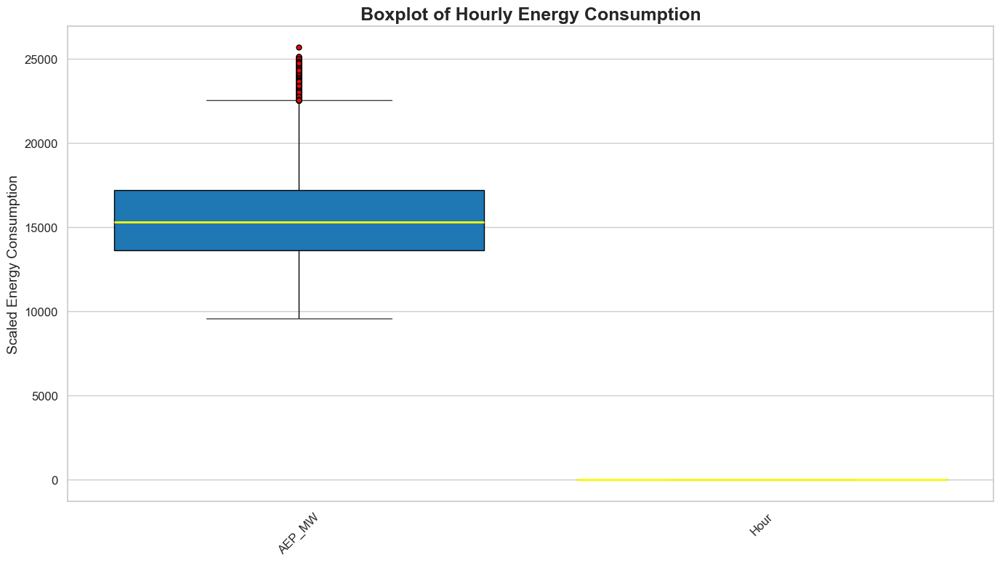

In [80]:
main_color = plt.get_cmap('tab20').colors[0]
sns.set_theme(style="whitegrid", palette="tab20", font_scale=1.2)
plt.figure(figsize=(14, 8))
boxplot = sns.boxplot(
    data=df,
    palette=[main_color] * len(df.columns),
    showcaps=True,
    boxprops={'facecolor': main_color, 'edgecolor': 'black'},
    showfliers=True,
    whiskerprops={'color': 'black'},
    flierprops={'marker': 'o', 'markerfacecolor': 'red', 'markersize': 5, 'markeredgecolor': 'black'},
    medianprops={'color': 'yellow', 'linewidth': 2}
)
plt.title('Boxplot of Hourly Energy Consumption', fontsize=18, fontweight='bold')
plt.ylabel('Scaled Energy Consumption', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()

### Plotting a histogram for each hour to identify which Scaler to use

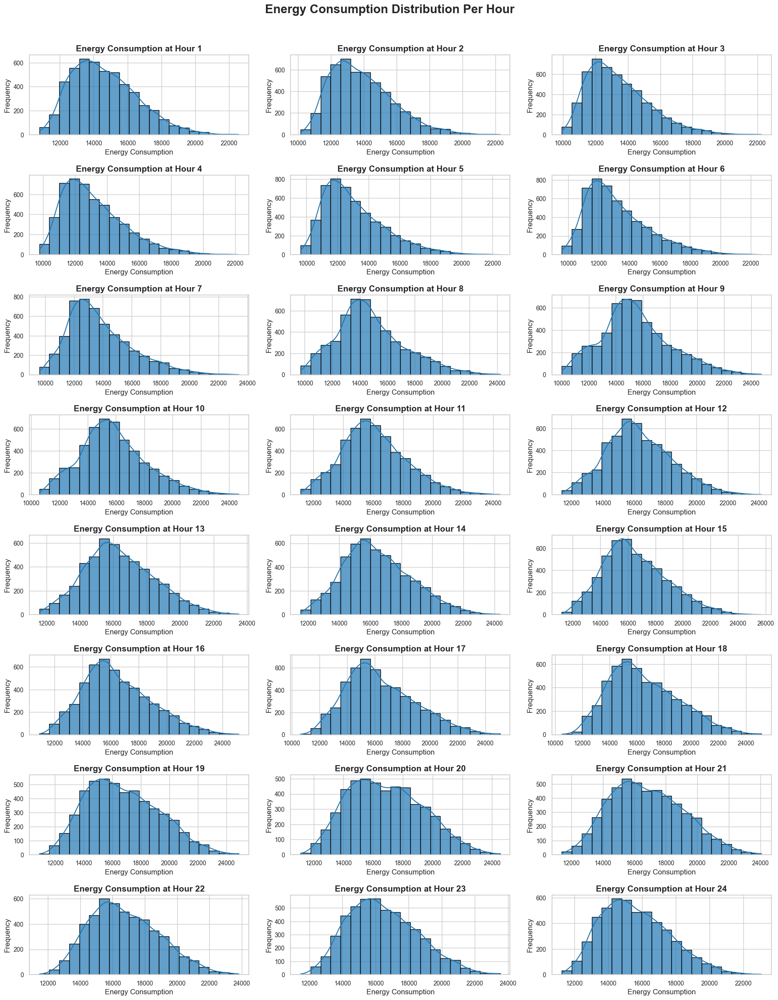

In [81]:
hours_plot = [x for x in range(0, 24)]

fig, ax = plt.subplots(8, 3, figsize=(18, 24))
fig.subplots_adjust(hspace=0.5, wspace=0.3)
ax = ax.flatten()
main_color = plt.get_cmap('tab20').colors[0]

for i, hour in enumerate(hours_plot):
    sns.histplot(
        pivot_df[hour],
        kde=True,
        ax=ax[i],
        color=main_color,
        edgecolor='black',
        bins=20,
        alpha=0.7
    )
    ax[i].set_title(f'Energy Consumption at Hour {hour + 1}', fontsize=14, fontweight='bold')
    ax[i].set_xlabel('Energy Consumption', fontsize=12)
    ax[i].set_ylabel('Frequency', fontsize=12)
    ax[i].tick_params(axis='x', labelsize=10)
    ax[i].tick_params(axis='y', labelsize=10)

for j in range(len(hours_plot), len(ax)):
    fig.delaxes(ax[j])

fig.suptitle('Energy Consumption Distribution Per Hour', fontsize=20, fontweight='bold')
plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()

In [82]:
print(pivot_df.describe())

Hour             0             1             2             3             4   \
count   5055.000000   5055.000000   5055.000000   5055.000000   5055.000000   
mean   14651.191569  13891.659941  13432.558160  13184.037587  13095.899604   
std     1921.790943   1897.582366   1920.009151   1957.665613   2007.584369   
min    10789.000000  10158.000000   9929.000000   9776.000000   9623.000000   
25%    13192.000000  12454.000000  11987.500000  11713.500000  11601.000000   
50%    14392.000000  13608.000000  13087.000000  12773.000000  12643.000000   
75%    15892.500000  15050.000000  14558.000000  14288.000000  14221.000000   
max    22584.000000  22297.000000  22241.000000  22227.000000  22486.000000   

Hour             5             6             7             8             9   \
count   5055.000000   5055.000000   5055.000000   5055.000000   5055.000000   
mean   13240.846093  13802.600593  14781.673788  15478.697725  15822.453215   
std     2079.663831   2207.586591   2479.291485   2

### Ploting energy consumption per hour before the scaler

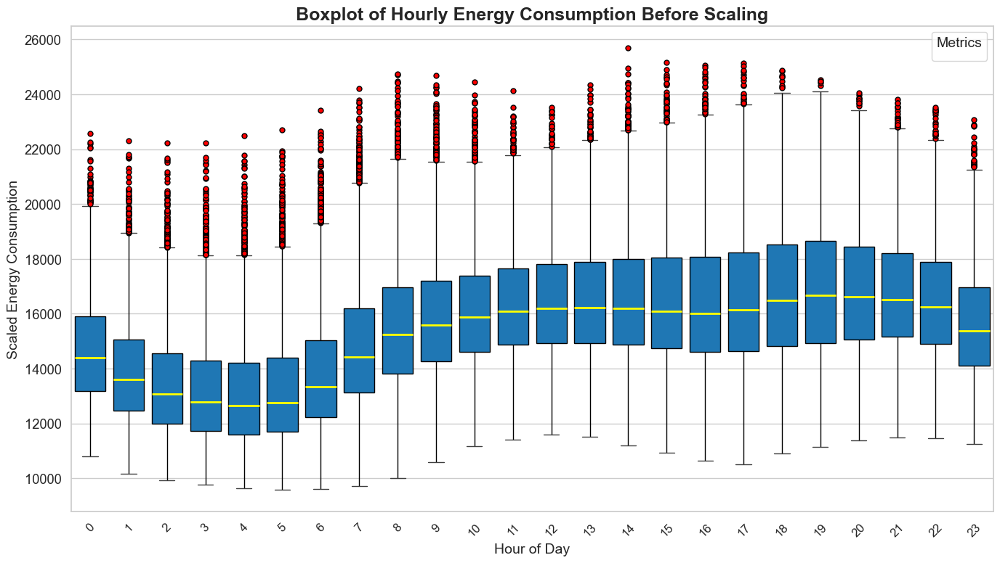

In [83]:
main_color = plt.get_cmap('tab20').colors[0]
sns.set_theme(style="whitegrid", palette="tab20", font_scale=1.2)

# Plotting the boxplot
plt.figure(figsize=(14, 8))
boxplot = sns.boxplot(
    data=pivot_df,
    palette=[main_color] * len(pivot_df.columns),
    showcaps=True,
    boxprops={'facecolor': main_color, 'edgecolor': 'black'},
    showfliers=True,
    whiskerprops={'color': 'black'},
    flierprops={'marker': 'o', 'markerfacecolor': 'red', 'markersize': 5, 'markeredgecolor': 'black'},
    medianprops={'color': 'yellow', 'linewidth': 2}
)
plt.title('Boxplot of Hourly Energy Consumption Before Scaling', fontsize=18, fontweight='bold')
plt.xlabel('Hour of Day', fontsize=14)
plt.ylabel('Scaled Energy Consumption', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.legend(title='Metrics', title_fontsize=14, fontsize=12)
plt.tight_layout()
plt.show()

### *Using Standard Scaler*

In [84]:
Scaler = StandardScaler()

data_scale = Scaler.fit_transform(pivot_df)

df_scale = pd.DataFrame(data_scale, index=pivot_df.index, columns=pivot_df.columns)

Hour             0             1             2             3             4   \
count  5.055000e+03  5.055000e+03  5.055000e+03  5.055000e+03  5.055000e+03   
mean   2.473898e-16  2.698797e-16 -4.273096e-16 -2.248998e-16 -4.160646e-16   
std    1.000099e+00  1.000099e+00  1.000099e+00  1.000099e+00  1.000099e+00   
min   -2.009882e+00 -1.967782e+00 -1.824942e+00 -1.741040e+00 -1.730061e+00   
25%   -7.593625e-01 -7.577021e-01 -7.527053e-01 -7.512432e-01 -7.446997e-01   
50%   -1.348831e-01 -1.494997e-01 -1.799952e-01 -2.099839e-01 -2.256166e-01   
75%    6.459762e-01  6.104898e-01  5.862228e-01  5.639735e-01  5.604804e-01   
max    4.128229e+00  4.429938e+00  4.588162e+00  4.619715e+00  4.677776e+00   

Hour             5             6             7             8             9   \
count  5.055000e+03  5.055000e+03  5.055000e+03  5.055000e+03  5.055000e+03   
mean   1.124499e-16 -1.799198e-16  3.373497e-17  2.361448e-16 -2.698797e-16   
std    1.000099e+00  1.000099e+00  1.000099e+00  1.

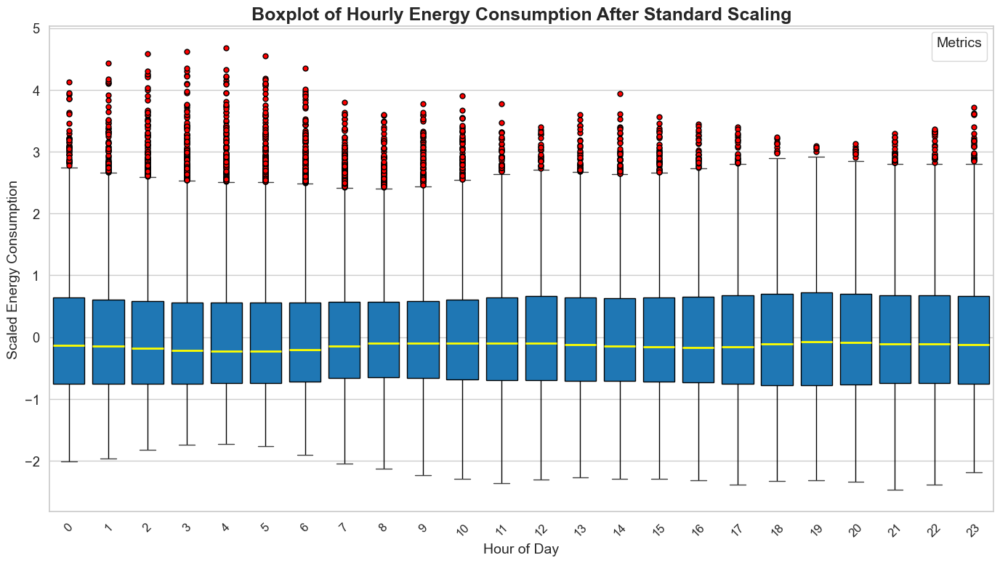

In [85]:
print(df_scale.describe())

main_color = plt.get_cmap('tab20').colors[0]
sns.set_theme(style="whitegrid", palette="tab20", font_scale=1.2)

# Plotting the boxplot
plt.figure(figsize=(14, 8))
boxplot = sns.boxplot(
    data=df_scale,
    palette=[main_color] * len(df_scale.columns),
    showcaps=True,
    boxprops={'facecolor': main_color, 'edgecolor': 'black'},
    showfliers=True,
    whiskerprops={'color': 'black'},
    flierprops={'marker': 'o', 'markerfacecolor': 'red', 'markersize': 5, 'markeredgecolor': 'black'},
    medianprops={'color': 'yellow', 'linewidth': 2}
)
plt.title('Boxplot of Hourly Energy Consumption After Standard Scaling', fontsize=18, fontweight='bold')
plt.xlabel('Hour of Day', fontsize=14)
plt.ylabel('Scaled Energy Consumption', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.legend(title='Metrics', title_fontsize=14, fontsize=12)
plt.tight_layout()
plt.show()

### *Using MinMaxScaler*

In [86]:
minmax_scaler = MinMaxScaler()

data_scale = minmax_scaler.fit_transform(pivot_df)

df_scale = pd.DataFrame(data_scale, index=pivot_df.index, columns=pivot_df.columns)

Hour            0            1            2            3            4   \
count  5055.000000  5055.000000  5055.000000  5055.000000  5055.000000   
mean      0.327443     0.307576     0.284565     0.273716     0.269991   
std       0.162933     0.156321     0.155946     0.157230     0.156074   
min       0.000000     0.000000     0.000000     0.000000     0.000000   
25%       0.203730     0.189142     0.167195     0.155610     0.153774   
50%       0.305468     0.284208     0.256498     0.240704     0.234782   
75%       0.432683     0.402999     0.375975     0.362381     0.357459   
max       1.000000     1.000000     1.000000     1.000000     1.000000   

Hour            5            6            7            8            9   ...  \
count  5055.000000  5055.000000  5055.000000  5055.000000  5055.000000  ...   
mean      0.279122     0.304070     0.350174     0.371074     0.371742  ...   
std       0.158608     0.159877     0.170880     0.174649     0.166584  ...   
min       0.00000

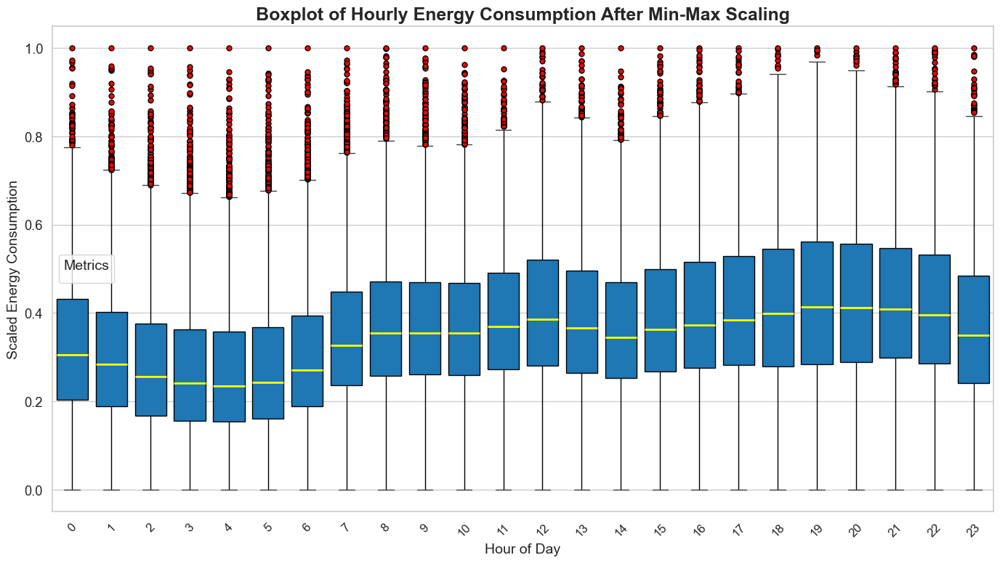

In [87]:
print(df_scale.describe())

main_color = plt.get_cmap('tab20').colors[0]
sns.set_theme(style="whitegrid", palette="tab20", font_scale=1.2)

# Plotting the boxplot
plt.figure(figsize=(14, 8))
boxplot = sns.boxplot(
    data=df_scale,
    palette=[main_color] * len(df_scale.columns),
    showcaps=True,
    boxprops={'facecolor': main_color, 'edgecolor': 'black'},
    showfliers=True,
    whiskerprops={'color': 'black'},
    flierprops={'marker': 'o', 'markerfacecolor': 'red', 'markersize': 5, 'markeredgecolor': 'black'},
    medianprops={'color': 'yellow', 'linewidth': 2}
)
plt.title('Boxplot of Hourly Energy Consumption After Min-Max Scaling', fontsize=18, fontweight='bold')
plt.xlabel('Hour of Day', fontsize=14)
plt.ylabel('Scaled Energy Consumption', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.legend(title='Metrics', title_fontsize=14, fontsize=12)
plt.tight_layout()
plt.show()

### *Using RobustScaler* (Outliers Handling)

In [88]:
Robust_Scaler = RobustScaler()

robust_data = Robust_Scaler.fit_transform(pivot_df)

df_scale = pd.DataFrame(robust_data, index=pivot_df.index, columns=pivot_df.columns)

Hour            0            1            2            3            4   \
count  5055.000000  5055.000000  5055.000000  5055.000000  5055.000000   
mean      0.095979     0.109268     0.134432     0.159657     0.172862   
std       0.711643     0.730964     0.746940     0.760406     0.766254   
min      -1.334197    -1.328968    -1.228555    -1.164110    -1.152672   
25%      -0.444362    -0.444530    -0.427738    -0.411536    -0.397710   
50%       0.000000     0.000000     0.000000     0.000000     0.000000   
75%       0.555638     0.555470     0.572262     0.588464     0.602290   
max       3.033512     3.347072     3.561175     3.672169     3.756870   

Hour            5            6            7            8            9   ...  \
count  5055.000000  5055.000000  5055.000000  5055.000000  5055.000000  ...   
mean      0.178633     0.162785     0.113712     0.079036     0.080577  ...   
std       0.769391     0.780204     0.810888     0.820526     0.800249  ...   
min      -1.17536

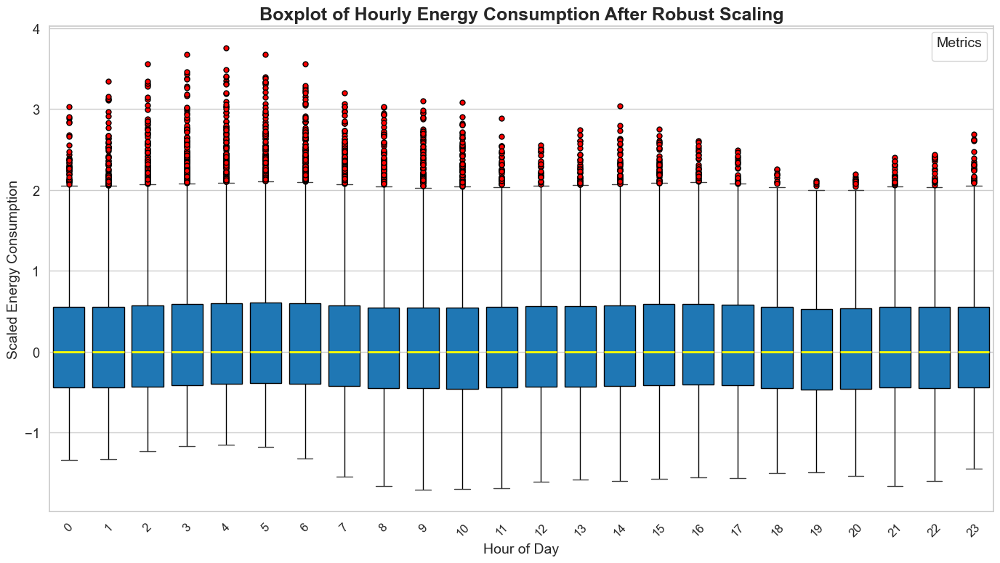

In [89]:
print(df_scale.describe())


main_color = plt.get_cmap('tab20').colors[0]
sns.set_theme(style="whitegrid", palette="tab20", font_scale=1.2)

# Plotting the boxplot
plt.figure(figsize=(14, 8))
boxplot = sns.boxplot(
    data=df_scale,
    palette=[main_color] * len(df_scale.columns),
    showcaps=True,
    boxprops={'facecolor': main_color, 'edgecolor': 'black'},
    showfliers=True,
    whiskerprops={'color': 'black'},
    flierprops={'marker': 'o', 'markerfacecolor': 'red', 'markersize': 5, 'markeredgecolor': 'black'},
    medianprops={'color': 'yellow', 'linewidth': 2}
)
plt.title('Boxplot of Hourly Energy Consumption After Robust Scaling', fontsize=18, fontweight='bold')
plt.xlabel('Hour of Day', fontsize=14)
plt.ylabel('Scaled Energy Consumption', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.legend(title='Metrics', title_fontsize=14, fontsize=12)
plt.tight_layout()
plt.show()

# **Implementing K-Means**

* ### Elbow Method

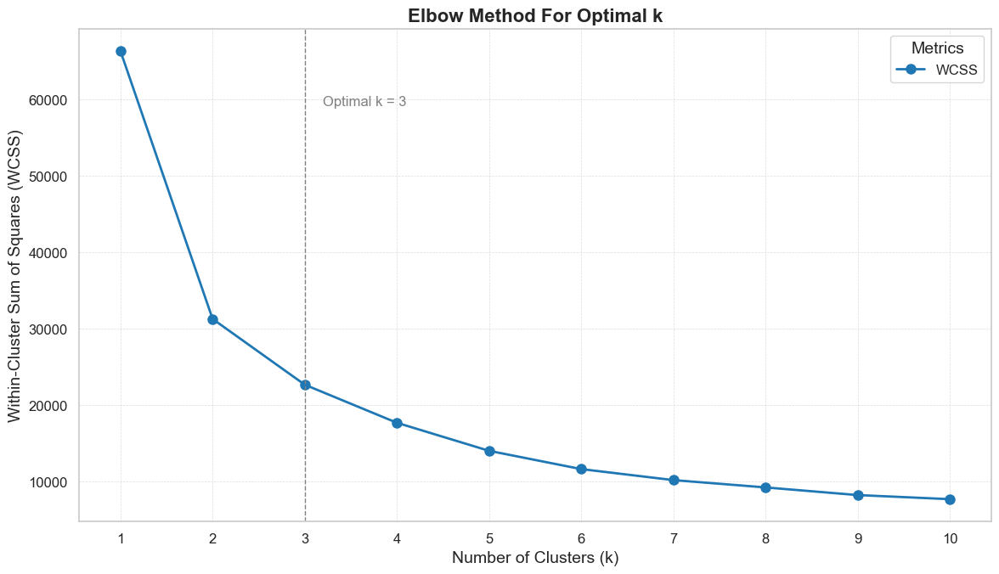

In [90]:
# cluster range numbers for K value
cluster_range = range(1, 11)
wcss = []

# calculate WCSS for a range of cluster numbers (WCSS: Within-Cluster Sum of Squares)
for k in cluster_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(df_scale)
    wcss.append(kmeans.inertia_)


optimal_k = cluster_range[list(wcss).index(min(wcss[:3]))]

plt.figure(figsize=(12, 7))

main_color = plt.get_cmap('tab20').colors[0]

plt.plot(
    cluster_range,
    wcss,
    marker='o',
    color=main_color,
    linewidth=2,
    markersize=8,
    label='WCSS'
)
plt.axvline(x=optimal_k, color='gray', linestyle='--', linewidth=1)
plt.text(
    optimal_k + 0.2,
    max(wcss) - (max(wcss) * 0.1),
    f'Optimal k = {optimal_k}',
    color='gray',
    fontsize=12,
    verticalalignment='center'
)
plt.title('Elbow Method For Optimal k', fontsize=16, fontweight='bold')
plt.xlabel('Number of Clusters (k)', fontsize=14)
plt.ylabel('Within-Cluster Sum of Squares (WCSS)', fontsize=14)
plt.xticks(cluster_range, fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
plt.legend(title='Metrics', title_fontsize=14, fontsize=12)
plt.tight_layout()
plt.show()

In [91]:
optimal_k = 3

kmeans = KMeans(n_clusters=optimal_k, random_state=42)
cluster_labels = kmeans.fit_predict(df_scale)

df_scale['Cluster'] = cluster_labels
pivot_df['Cluster'] = cluster_labels

cluster_centers = kmeans.cluster_centers_

# Converting cluster centers to a DataFrame
cluster_centers_df = pd.DataFrame(cluster_centers, columns=df_scale.columns[:-1])

# To interpret the cluster centers in the original scale, inverse transform them using the scaler.
original_cluster_centers = Scaler.inverse_transform(cluster_centers_df)

# Then convert to DataFrame again
original_centers_df = pd.DataFrame(original_cluster_centers, columns=pivot_df.columns[:-1])

### Average Daily Profiles

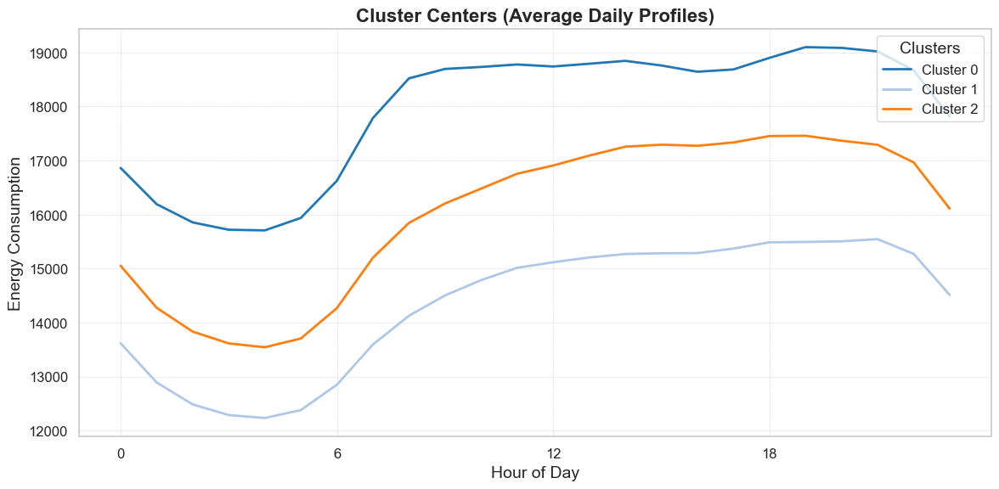

In [92]:
color_palette = plt.get_cmap('tab20').colors[:optimal_k]

plt.figure(figsize=(12, 6))

for i in range(optimal_k):
    plt.plot(
        range(24), 
        original_centers_df.iloc[i], 
        label=f'Cluster {i}', 
        color=color_palette[i],
        linewidth=2
    )

plt.xlabel('Hour of Day', fontsize=14)
plt.ylabel('Energy Consumption', fontsize=14)
plt.title('Cluster Centers (Average Daily Profiles)', fontsize=16, fontweight='bold')

plt.legend(title='Clusters', title_fontsize=14, fontsize=12, loc='upper right')

plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)

plt.xticks(range(0, 24, 6), fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()


### Pie Chart

Number of days in each cluster:
Cluster
0     968
1    1985
2    2102
Name: count, dtype: int64


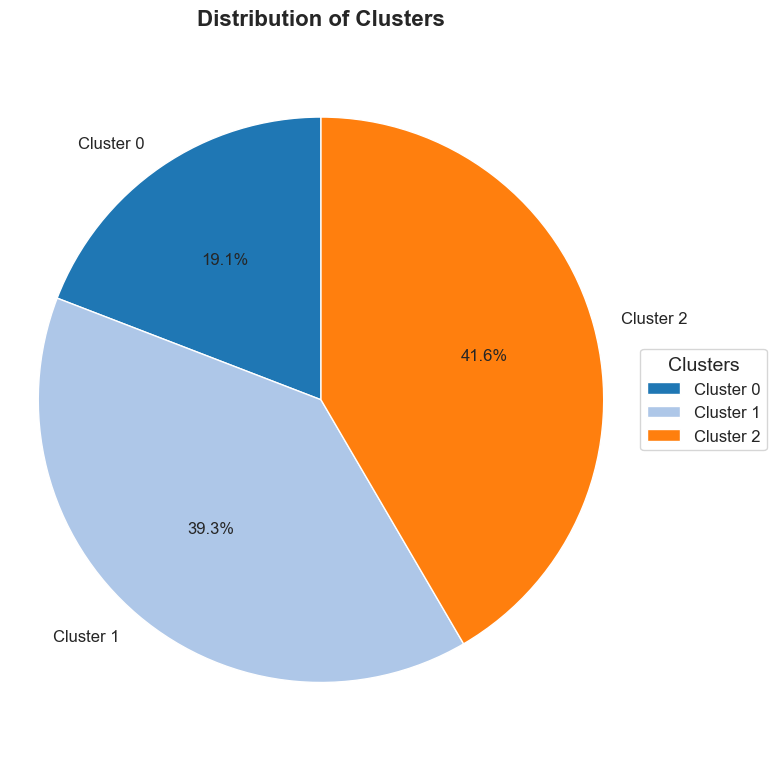

In [93]:
# No. of days in each cluster
cluster_counts = df_scale['Cluster'].value_counts().sort_index()
print("Number of days in each cluster:")
print(cluster_counts)


color_palette = plt.get_cmap('tab20').colors[:optimal_k]
labels = [f'Cluster {i}' for i in range(optimal_k)]

plt.figure(figsize=(8, 8))
patches, texts, autotexts = plt.pie(
    cluster_counts,
    autopct='%1.1f%%',
    startangle=90,
    colors=color_palette,
    labels=labels,
    textprops={'fontsize': 12}
)

plt.title('Distribution of Clusters', fontsize=16, fontweight='bold')
plt.ylabel('')

plt.legend(
    patches,
    labels,
    title='Clusters',
    loc='center left',
    bbox_to_anchor=(1, 0, 0.5, 1),
    fontsize=12,
    title_fontsize=14
)

plt.axis('equal')
plt.tight_layout()
plt.show()

### Bar Chart

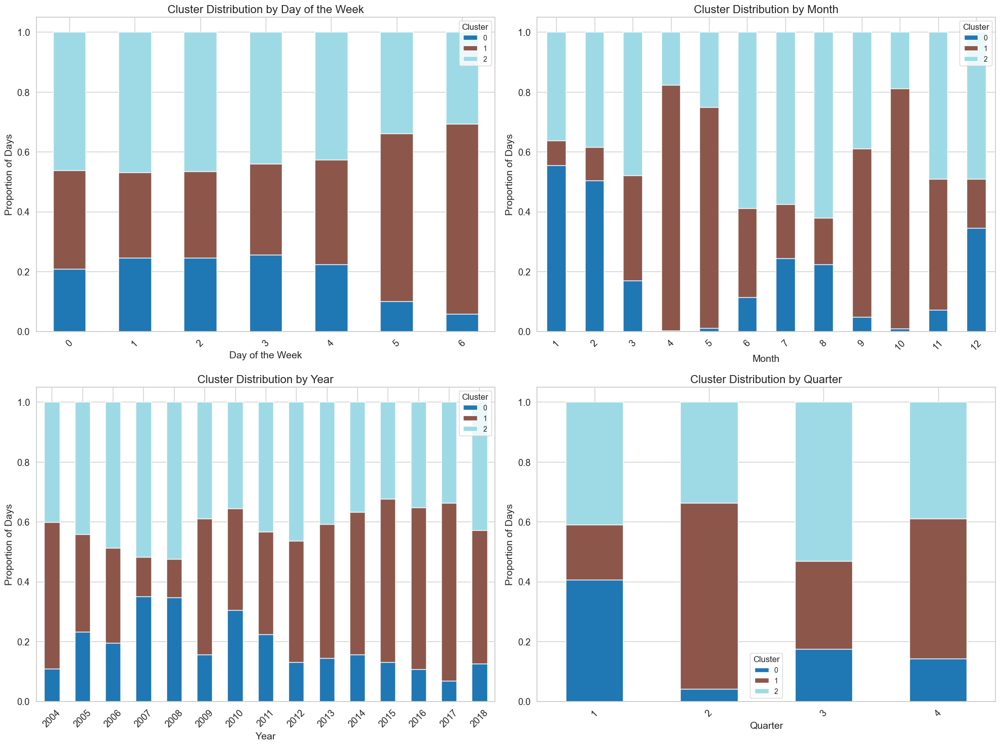

In [94]:
# Ensuring pivot_df index is in datetime format
pivot_df.index = pd.to_datetime(pivot_df.index)

cluster_analysis_df = pivot_df[['Cluster']].copy()
cluster_analysis_df['Date'] = cluster_analysis_df.index

# Extract time features
cluster_analysis_df['DayOfWeek'] = cluster_analysis_df['Date'].dt.dayofweek
cluster_analysis_df['Month'] = cluster_analysis_df['Date'].dt.month
cluster_analysis_df['Year'] = cluster_analysis_df['Date'].dt.year
cluster_analysis_df['Quarter'] = cluster_analysis_df['Date'].dt.quarter

# Analyze the distribution of clusters by day of the week, month, year, and quarter
dayofweek_cluster = cluster_analysis_df.groupby('DayOfWeek')['Cluster'].value_counts(normalize=True).unstack()
month_cluster = cluster_analysis_df.groupby('Month')['Cluster'].value_counts(normalize=True).unstack()
year_cluster = cluster_analysis_df.groupby('Year')['Cluster'].value_counts(normalize=True).unstack()
quarter_cluster = cluster_analysis_df.groupby('Quarter')['Cluster'].value_counts(normalize=True).unstack()

# List of distributions and names
distribution_clusters = [dayofweek_cluster, month_cluster, year_cluster, quarter_cluster]
distribution_clusters_names = ['Day of the Week', 'Month', 'Year', 'Quarter']

# Creating a 2x2
fig, axes = plt.subplots(2, 2, figsize=(20, 15))
axes = axes.flatten()

for idx, (data, name) in enumerate(zip(distribution_clusters, distribution_clusters_names)):
    ax = axes[idx]
    data.plot(kind='bar', stacked=True, ax=ax, colormap='tab20')
    ax.set_title(f'Cluster Distribution by {name}', fontsize=16)
    ax.set_xlabel(name, fontsize=14)
    ax.set_ylabel('Proportion of Days', fontsize=14)
    ax.legend(title='Cluster', title_fontsize=12, fontsize=10)
    ax.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


In [95]:
# Count the number of days in each cluster
cluster_counts = df_scale['Cluster'].value_counts().sort_index()
print("Number of days in each cluster:")
print(cluster_counts)


Number of days in each cluster:
Cluster
0     968
1    1985
2    2102
Name: count, dtype: int64


## Let's try to compare a new k number with the optimal K number

### Code for PCA visualization for K= [3, 4]

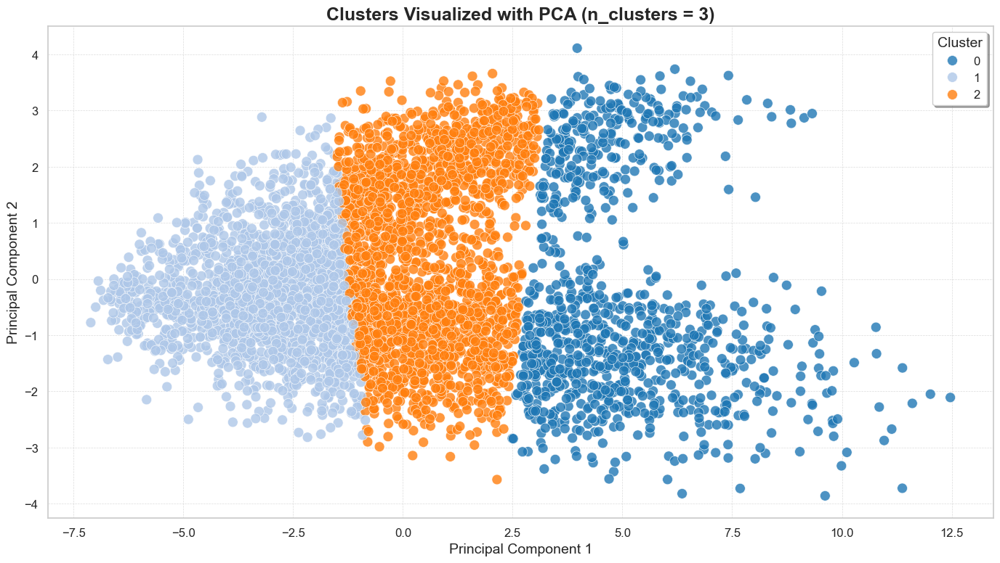

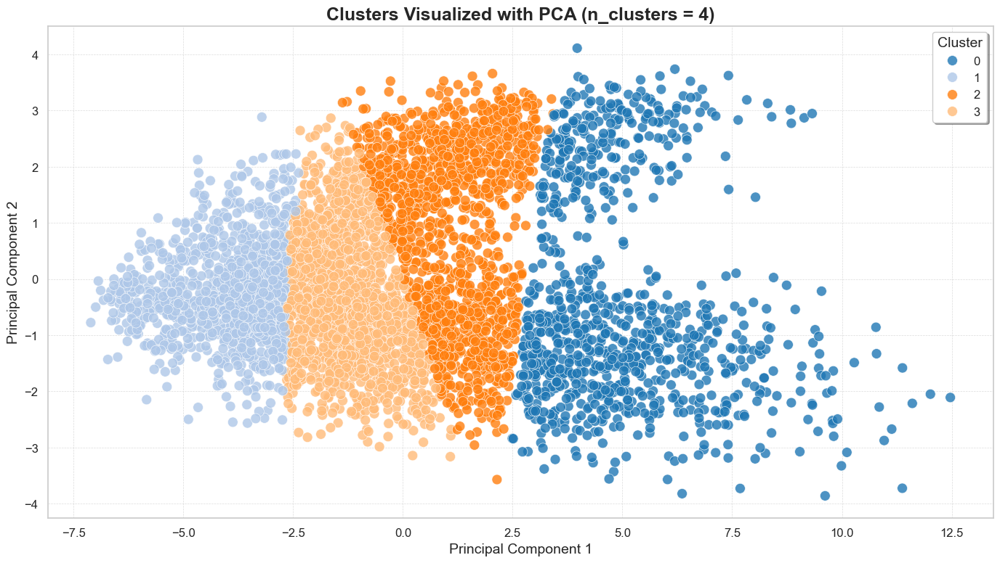

In [96]:
# List of K values to compare
k_values = [3, 4]

# Convert all column names to strings
df_scale.columns = df_scale.columns.astype(str)

for n_clusters in k_values:

    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(df_scale)

    # PCA reduces data to 2 dimensions
    pca = PCA(n_components=2)
    principal_components = pca.fit_transform(df_scale)

    pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])
    pca_df['Cluster'] = cluster_labels

    color_palette = plt.get_cmap('tab20').colors[:n_clusters]
    cluster_colors = {i: color_palette[i] for i in range(n_clusters)}

    plt.figure(figsize=(14, 8))
    scatter = sns.scatterplot(
        x='PC1',
        y='PC2',
        hue='Cluster',
        data=pca_df,
        palette=cluster_colors,
        s=100,                   
        alpha=0.8,               
        edgecolor='w',           
        linewidth=0.5
    )

    plt.title(f'Clusters Visualized with PCA (n_clusters = {n_clusters})', fontsize=18, fontweight='bold')
    plt.xlabel('Principal Component 1', fontsize=14)
    plt.ylabel('Principal Component 2', fontsize=14)
    plt.legend(
        title='Cluster',
        title_fontsize=14,
        fontsize=12,
        loc='upper right',
        frameon=True,
        fancybox=True,
        shadow=True
    )
    plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.tight_layout()
    plt.show()


### Code for t-SNE visualization for K= [3, 4]

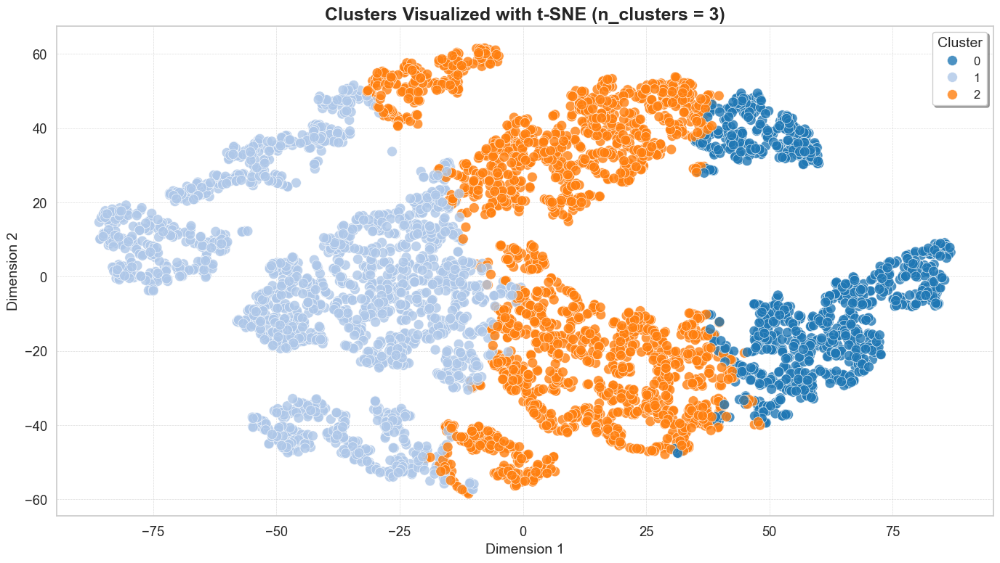

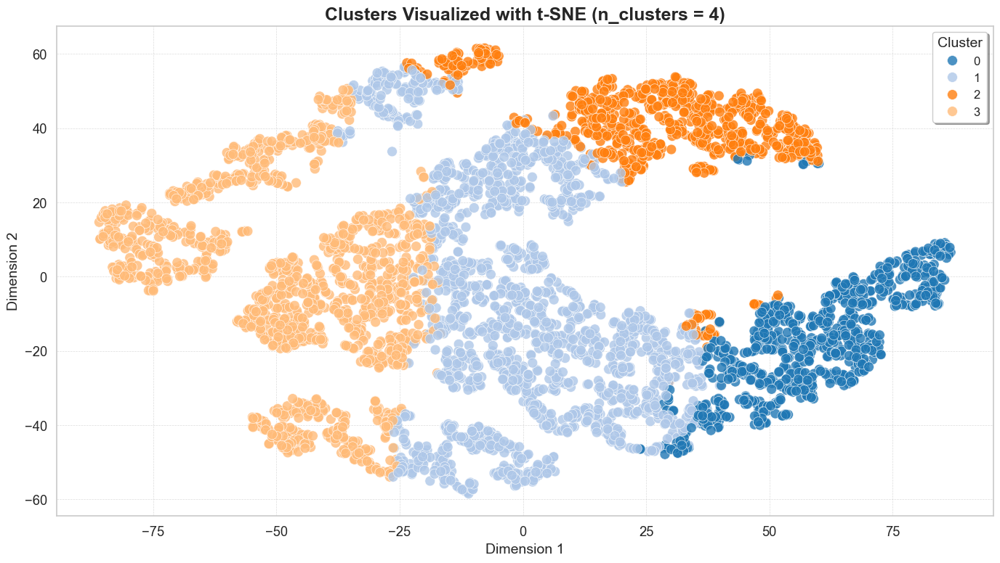

In [97]:
k_values = [3,4]

for n_clusters in k_values:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(df_scale)
    df_scale['Cluster'] = cluster_labels
    df_scale_no_cluster = df_scale.drop('Cluster', axis=1)
    tsne = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42)
    X_tsne = tsne.fit_transform(df_scale_no_cluster)
    tsne_df = pd.DataFrame(data=X_tsne, columns=['Dim1', 'Dim2'])
    tsne_df['Cluster'] = cluster_labels
    
    # Use sns.color_palette to generate a color palette for the clusters
    color_palette = sns.color_palette('tab20', n_colors=n_clusters)
    
    plt.figure(figsize=(14, 8))
    sns.scatterplot(
        x='Dim1',
        y='Dim2',
        hue='Cluster',
        data=tsne_df,
        palette=color_palette,
        s=100,
        alpha=0.8,
        edgecolor='w',
        linewidth=0.5
    )
    plt.title(f'Clusters Visualized with t-SNE (n_clusters = {n_clusters})', fontsize=18, fontweight='bold')
    plt.xlabel('Dimension 1', fontsize=14)
    plt.ylabel('Dimension 2', fontsize=14)
    plt.legend(title='Cluster', title_fontsize=14, fontsize=12, loc='upper right', frameon=True, fancybox=True, shadow=True)
    plt.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
    plt.tight_layout()
    plt.show()
    
    df_scale = df_scale.drop('Cluster', axis=1)


### Cluster Centers Plotting

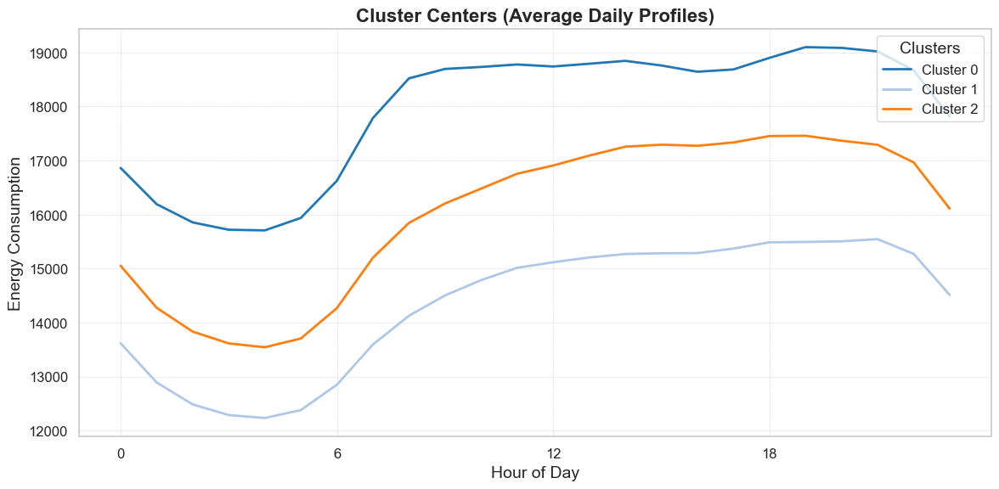

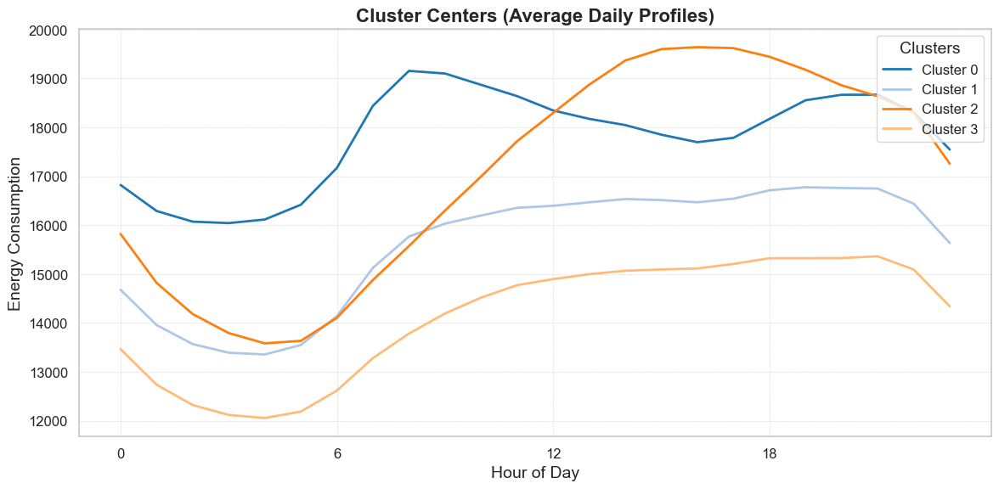

In [98]:
# List of K values to compare
k_values = [3, 4]

# Drop 'Cluster' column if it exists
if 'Cluster' in df_scale.columns:
    df_scale = df_scale.drop('Cluster', axis=1)
if 'Cluster' in pivot_df.columns:
    pivot_df = pivot_df.drop('Cluster', axis=1)

# Convert all column names to strings
df_scale.columns = df_scale.columns.astype(str)
pivot_df.columns = pivot_df.columns.astype(str)

# Define feature columns
feature_columns_scale = [col for col in df_scale.columns if col != 'Cluster']
feature_columns_pivot = [col for col in pivot_df.columns if col != 'Cluster']


for n_clusters in k_values:
    # Initialize and fit KMeans
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(df_scale)
    
    # Add cluster labels to DataFrames
    df_scale['Cluster'] = cluster_labels
    pivot_df['Cluster'] = cluster_labels
    
    # Compute cluster centers in original scale
    cluster_centers = kmeans.cluster_centers_
    cluster_centers_df = pd.DataFrame(cluster_centers, columns=feature_columns_scale)
    
    # Inverse transform to original scale
    original_cluster_centers = Scaler.inverse_transform(cluster_centers_df)
    original_centers_df = pd.DataFrame(original_cluster_centers, columns=feature_columns_pivot)

    color_palette = plt.get_cmap('tab20').colors[:n_clusters]

    plt.figure(figsize=(12, 6))

    for i in range(n_clusters):
        plt.plot(
            range(24), 
            original_centers_df.iloc[i], 
            label=f'Cluster {i}', 
            color=color_palette[i],
            linewidth=2
        )

    plt.xlabel('Hour of Day', fontsize=14)
    plt.ylabel('Energy Consumption', fontsize=14)
    plt.title('Cluster Centers (Average Daily Profiles)', fontsize=16, fontweight='bold')

    plt.legend(title='Clusters', title_fontsize=14, fontsize=12, loc='upper right')

    plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)

    plt.xticks(range(0, 24, 6), fontsize=12)
    plt.yticks(fontsize=12)
    plt.tight_layout()
    plt.show()
    
    df_scale = df_scale.drop('Cluster', axis=1)
    pivot_df = pivot_df.drop('Cluster', axis=1)


### HeatMap

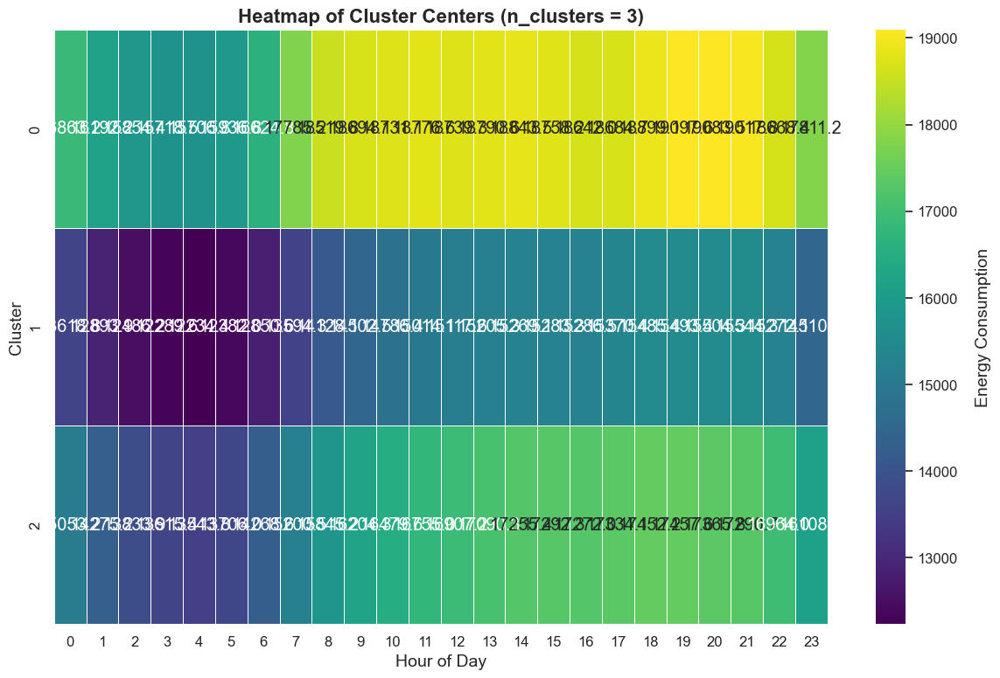

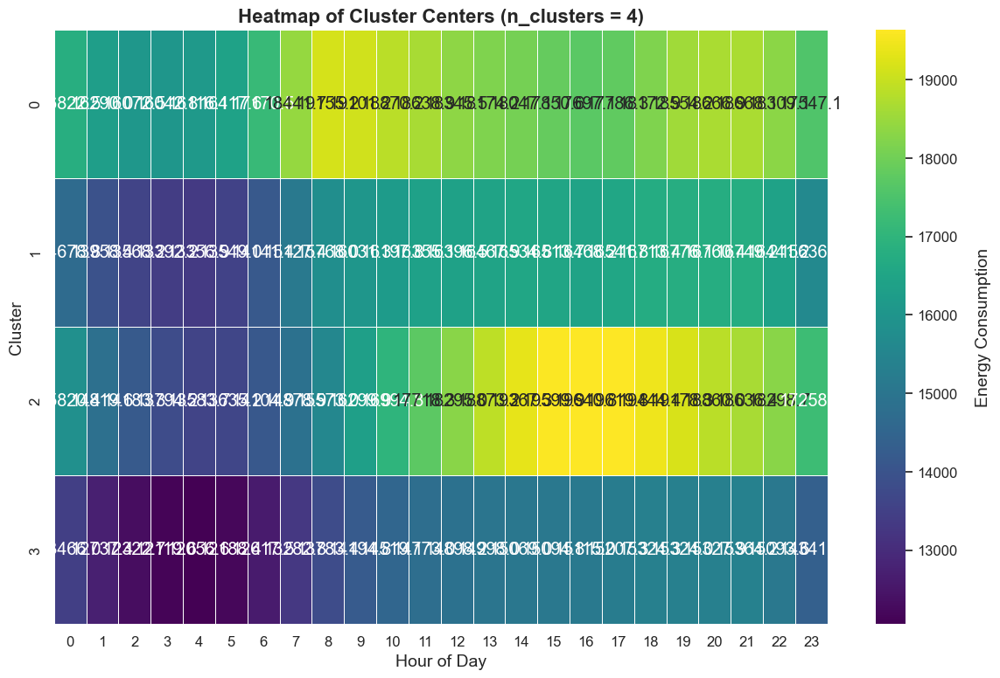

In [99]:
# List of K values to compare
k_values = [3, 4]

for n_clusters in k_values:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(df_scale)

    cluster_centers = kmeans.cluster_centers_
    cluster_centers_df = pd.DataFrame(cluster_centers, columns=feature_columns_scale)

    original_cluster_centers = Scaler.inverse_transform(cluster_centers_df)
    original_centers_df = pd.DataFrame(original_cluster_centers, columns=feature_columns_pivot)

    
    # Plot heatmap
    plt.figure(figsize=(12, 8)) 
    heatmap = sns.heatmap(
        original_centers_df,
        annot=True,
        fmt=".1f",
        cmap='viridis',
        cbar_kws={'label': 'Energy Consumption'},
        linewidths=0.5,
        linecolor='white'
    )

    plt.title(f'Heatmap of Cluster Centers (n_clusters = {n_clusters})', fontsize=16, fontweight='bold')
    plt.xlabel('Hour of Day', fontsize=14)
    plt.ylabel('Cluster', fontsize=14)

    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)

    cbar = heatmap.collections[0].colorbar
    cbar.ax.tick_params(labelsize=12)
    cbar.set_label('Energy Consumption', fontsize=14, labelpad=15)

    plt.tight_layout()
    plt.show()


### Clusters over time

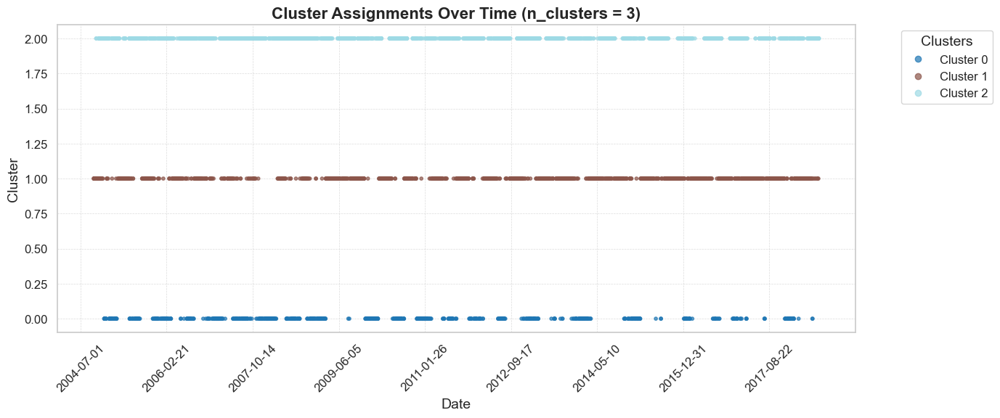

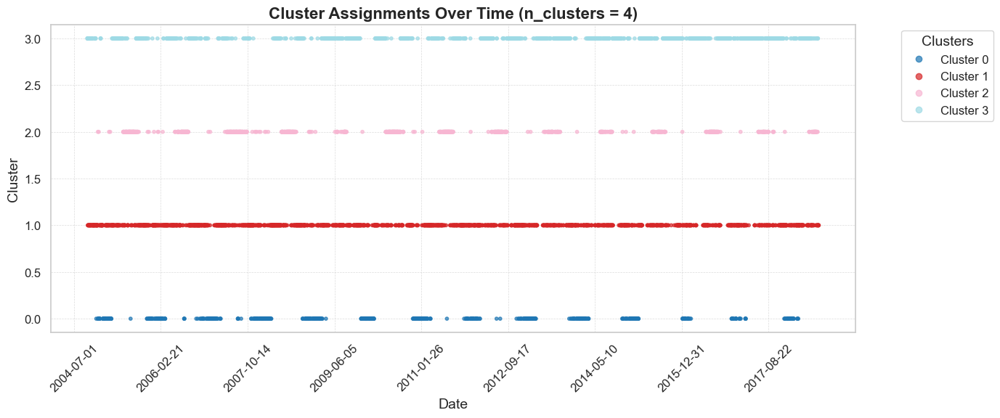

In [100]:
# List of K values to compare
k_values = [3, 4]

for n_clusters in k_values:

    kmeans = KMeans(n_clusters=n_clusters, random_state=42)

    cluster_labels = kmeans.fit_predict(df_scale)

    pivot_df['Cluster'] = cluster_labels

    pivot_df.index = pd.to_datetime(pivot_df.index)


    color_palette = plt.get_cmap('tab20').colors[:n_clusters]

    plt.figure(figsize=(14, 6))

    scatter = plt.scatter(
        pivot_df.index, 
        pivot_df['Cluster'], 
        c=cluster_labels, 
        cmap='tab20',
        s=10,
        alpha=0.7
    )

    handles, _ = scatter.legend_elements(prop="colors", alpha=0.7)
    legend_labels = [f'Cluster {i}' for i in range(n_clusters)]
    plt.legend(handles, legend_labels, title='Clusters', title_fontsize=14, fontsize=12, bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.xlabel('Date', fontsize=14)
    plt.ylabel('Cluster', fontsize=14)
    plt.title(f'Cluster Assignments Over Time (n_clusters = {n_clusters})', fontsize=16, fontweight='bold')
    plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)

    plt.gca().xaxis.set_major_locator(plt.MaxNLocator(10))
    plt.xticks(rotation=45, fontsize=12)
    plt.yticks(fontsize=12)

    plt.tight_layout()
    plt.show()

    pivot_df = pivot_df.drop('Cluster', axis=1)


### Clusters Size

In [101]:
k_values = [3, 4]

for n_clusters in k_values:

    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(df_scale)

    # Count of days in each cluster
    cluster_counts = pd.Series(cluster_labels).value_counts().sort_index()
    print(f"\nNumber of days in each cluster for n_clusters = {n_clusters}:")
    print(cluster_counts)



Number of days in each cluster for n_clusters = 3:
0     968
1    1985
2    2102
Name: count, dtype: int64

Number of days in each cluster for n_clusters = 4:
0     812
1    1918
2     792
3    1533
Name: count, dtype: int64


### Silhouette Score

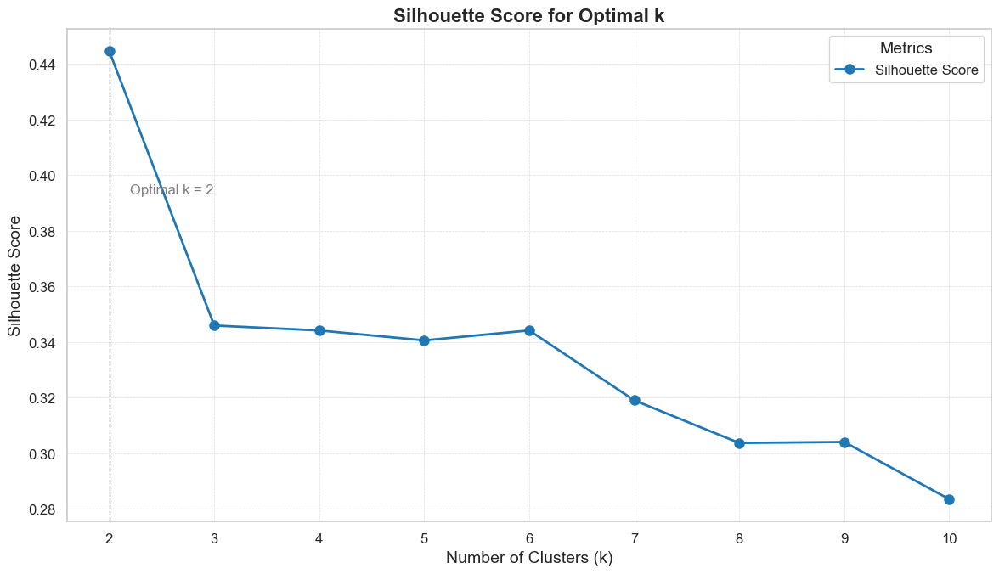

In [102]:
silhouette_scores = []

# calculate silhouette score for a range of cluster numbers
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    cluster_labels = kmeans.fit_predict(df_scale)
    silhouette_avg = silhouette_score(df_scale, cluster_labels)
    silhouette_scores.append(silhouette_avg)


main_color = plt.get_cmap('tab20').colors[0]

# Plot silhouette scores 
plt.figure(figsize=(12, 7))

plt.plot(
    range(2, 11), 
    silhouette_scores, 
    marker='o', 
    color=main_color, 
    linewidth=2, 
    markersize=8, 
    label='Silhouette Score'
)

optimal_k = silhouette_scores.index(max(silhouette_scores)) + 2
plt.axvline(x=optimal_k, color='gray', linestyle='--', linewidth=1)
plt.text(
    optimal_k + 0.2, 
    max(silhouette_scores) - 0.05, 
    f'Optimal k = {optimal_k}', 
    color='gray', 
    fontsize=12,
    verticalalignment='center'
)

plt.title('Silhouette Score for Optimal k', fontsize=16, fontweight='bold')
plt.xlabel('Number of Clusters (k)', fontsize=14)
plt.ylabel('Silhouette Score', fontsize=14)
plt.xticks(range(2, 11), fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
plt.legend(title='Metrics', title_fontsize=14, fontsize=12)
plt.tight_layout()
plt.show()


### Initialize and Fit the K-Means Model

In [103]:
optimal_k = 2

kmeans = KMeans(n_clusters=optimal_k, random_state=42)
cluster_labels = kmeans.fit_predict(df_scale)

df_scale['Cluster'] = cluster_labels
pivot_df['Cluster'] = cluster_labels

cluster_centers = kmeans.cluster_centers_

# Converting cluster centers to a DataFrame
cluster_centers_df = pd.DataFrame(cluster_centers, columns=df_scale.columns[:-1])

# To interpret the cluster centers in the original scale, inverse transform them using the scaler.
original_cluster_centers = Scaler.inverse_transform(cluster_centers_df)

# Then convert to DataFrame again
original_centers_df = pd.DataFrame(original_cluster_centers, columns=pivot_df.columns[:-1])


### Visualize Cluster Centers
Plot the average daily consumption profile for each cluster.

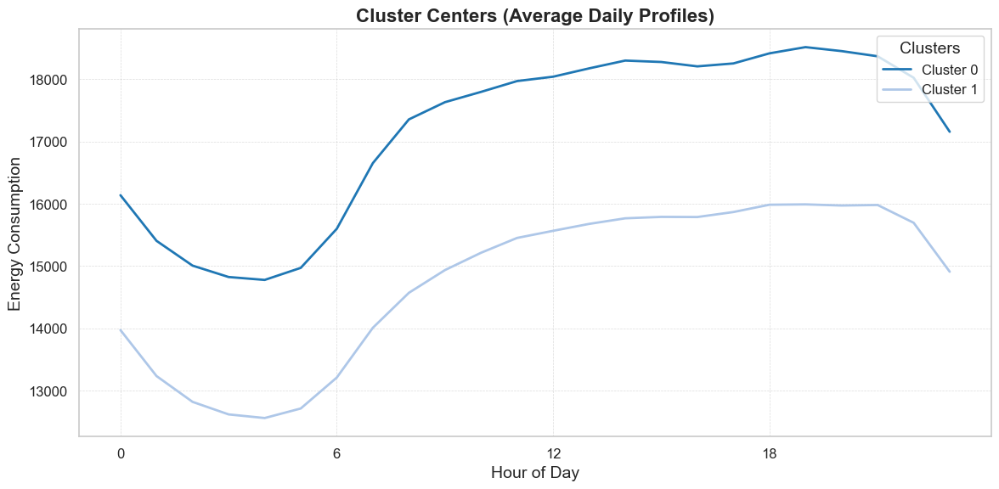

In [104]:
color_palette = plt.get_cmap('tab20').colors[:optimal_k]
plt.figure(figsize=(12, 6))

for i in range(optimal_k):
    plt.plot(
        range(24), 
        original_centers_df.iloc[i], 
        label=f'Cluster {i}', 
        color=color_palette[i],
        linewidth=2
    )

plt.xlabel('Hour of Day', fontsize=14)
plt.ylabel('Energy Consumption', fontsize=14)
plt.title('Cluster Centers (Average Daily Profiles)', fontsize=16, fontweight='bold')
plt.legend(title='Clusters', title_fontsize=14, fontsize=12, loc='upper right')
plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
plt.xticks(range(0, 24, 6), fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()


### the Distribution of Clusters
Count of Days in Each Cluster


In [105]:
# Count the number of days in each cluster
cluster_counts = df_scale['Cluster'].value_counts().sort_index()
print("Number of days in each cluster:")
print(cluster_counts)


Number of days in each cluster:
Cluster
0    2019
1    3036
Name: count, dtype: int64


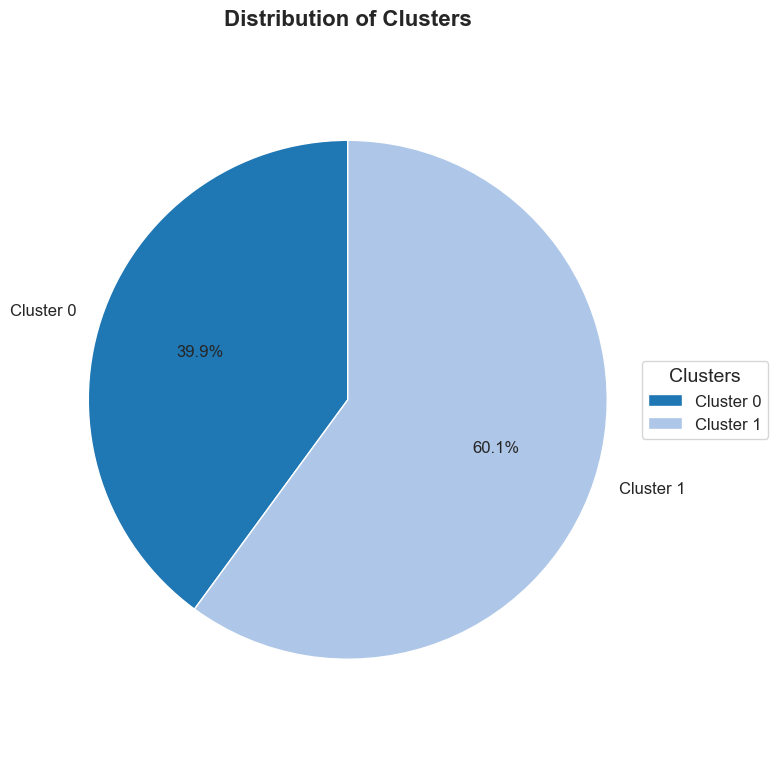

In [106]:
color_palette = plt.get_cmap('tab20').colors[:optimal_k]
labels = [f'Cluster {i}' for i in range(optimal_k)]

plt.figure(figsize=(8, 8))
patches, texts, autotexts = plt.pie(
    cluster_counts,
    autopct='%1.1f%%',
    startangle=90,
    colors=color_palette,
    labels=labels,
    textprops={'fontsize': 12}
)

plt.title('Distribution of Clusters', fontsize=16, fontweight='bold')
plt.ylabel('')

plt.legend(
    patches,
    labels,
    title='Clusters',
    loc='center left',
    bbox_to_anchor=(1, 0, 0.5, 1),
    fontsize=12,
    title_fontsize=14
)

plt.axis('equal')
plt.tight_layout()
plt.show()


### Bar plot

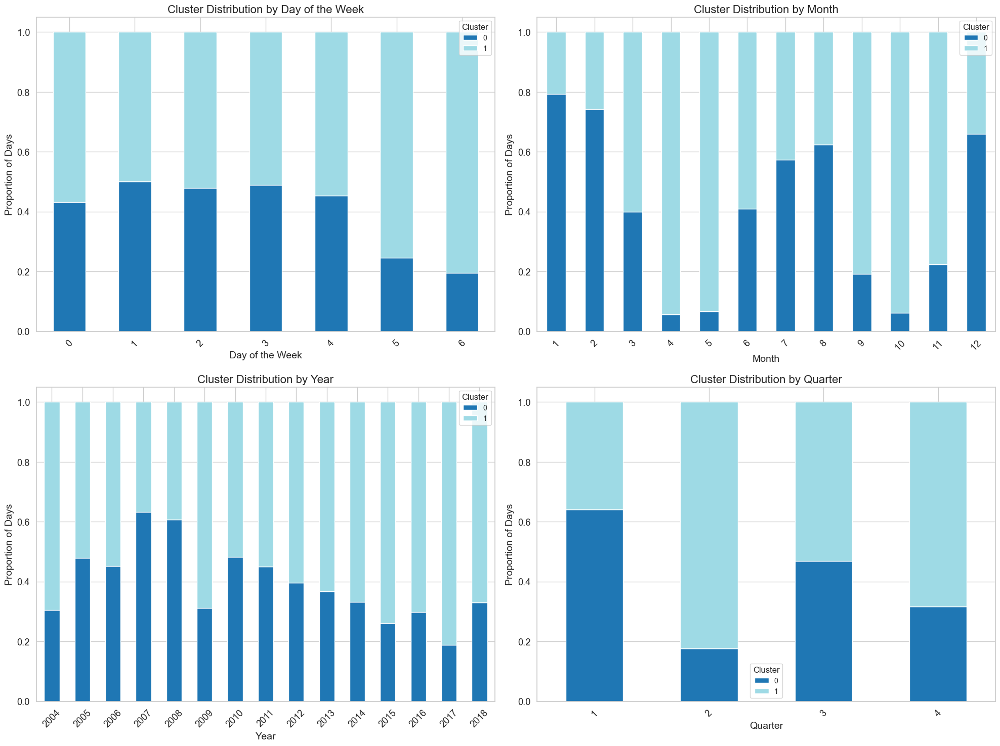

In [107]:
# Ensure pivot_df index is in datetime format
pivot_df.index = pd.to_datetime(pivot_df.index)

# Create a DataFrame with 'Cluster' and 'Date' columns as index for analysis
cluster_analysis_df = pivot_df[['Cluster']].copy()
cluster_analysis_df['Date'] = cluster_analysis_df.index

# Extract time features
cluster_analysis_df['DayOfWeek'] = cluster_analysis_df['Date'].dt.dayofweek
cluster_analysis_df['Month'] = cluster_analysis_df['Date'].dt.month
cluster_analysis_df['Year'] = cluster_analysis_df['Date'].dt.year
cluster_analysis_df['Quarter'] = cluster_analysis_df['Date'].dt.quarter

# Analyze the distribution of clusters by day of the week, month, year, and quarter
dayofweek_cluster = cluster_analysis_df.groupby('DayOfWeek')['Cluster'].value_counts(normalize=True).unstack()
month_cluster = cluster_analysis_df.groupby('Month')['Cluster'].value_counts(normalize=True).unstack()
year_cluster = cluster_analysis_df.groupby('Year')['Cluster'].value_counts(normalize=True).unstack()
quarter_cluster = cluster_analysis_df.groupby('Quarter')['Cluster'].value_counts(normalize=True).unstack()

# List of distributions and names
distribution_clusters = [dayofweek_cluster, month_cluster, year_cluster, quarter_cluster]
distribution_clusters_names = ['Day of the Week', 'Month', 'Year', 'Quarter']

# Creating a 2x2
fig, axes = plt.subplots(2, 2, figsize=(20, 15))
axes = axes.flatten()

for idx, (data, name) in enumerate(zip(distribution_clusters, distribution_clusters_names)):
    ax = axes[idx]
    data.plot(kind='bar', stacked=True, ax=ax, colormap='tab20')
    ax.set_title(f'Cluster Distribution by {name}', fontsize=16)
    ax.set_xlabel(name, fontsize=14)
    ax.set_ylabel('Proportion of Days', fontsize=14)
    ax.legend(title='Cluster', title_fontsize=12, fontsize=10)
    ax.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


### HeatMap

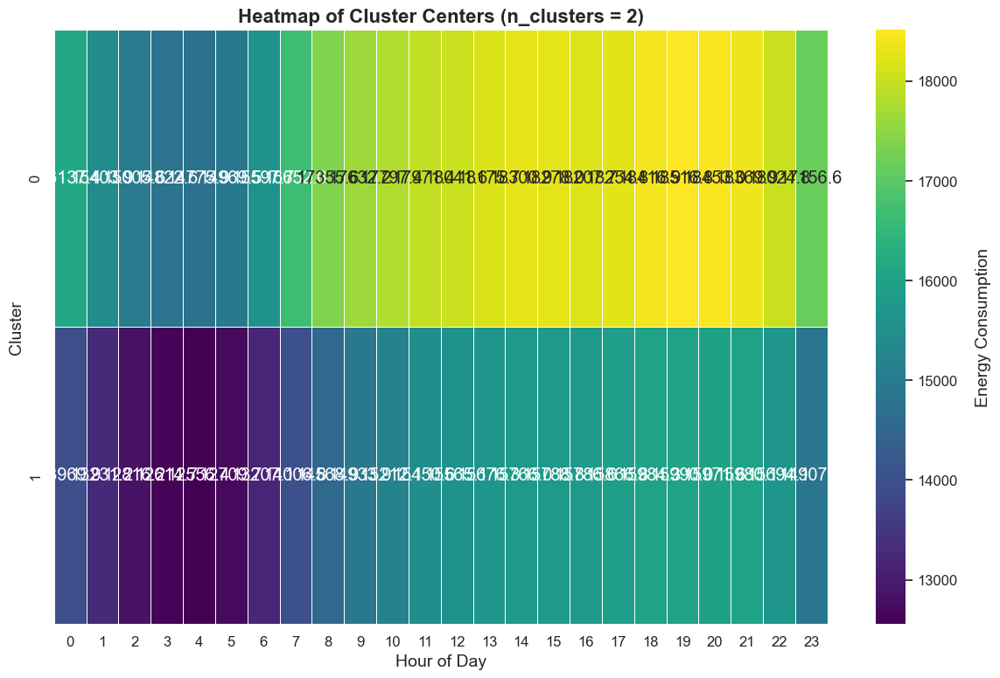

In [108]:
# List of K values to compare
k_values = [2]

# Drop 'Cluster' column if it exists
if 'Cluster' in df_scale.columns:
    df_scale = df_scale.drop('Cluster', axis=1)
if 'Cluster' in pivot_df.columns:
    pivot_df = pivot_df.drop('Cluster', axis=1)

# Define feature columns
feature_columns_scale = [col for col in df_scale.columns if col != 'Cluster']
feature_columns_pivot = [col for col in pivot_df.columns if col != 'Cluster']

for n_clusters in k_values:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(df_scale)

    cluster_centers = kmeans.cluster_centers_
    cluster_centers_df = pd.DataFrame(cluster_centers, columns=feature_columns_scale)

    original_cluster_centers = Scaler.inverse_transform(cluster_centers_df)
    original_centers_df = pd.DataFrame(original_cluster_centers, columns=feature_columns_pivot)

    
    # Plot heatmap
    plt.figure(figsize=(12, 8)) 
    heatmap = sns.heatmap(
        original_centers_df,
        annot=True,
        fmt=".1f",
        cmap='viridis',
        cbar_kws={'label': 'Energy Consumption'},
        linewidths=0.5,
        linecolor='white'
    )

    plt.title(f'Heatmap of Cluster Centers (n_clusters = {n_clusters})', fontsize=16, fontweight='bold')
    plt.xlabel('Hour of Day', fontsize=14)
    plt.ylabel('Cluster', fontsize=14)

    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)

    cbar = heatmap.collections[0].colorbar
    cbar.ax.tick_params(labelsize=12)
    cbar.set_label('Energy Consumption', fontsize=14, labelpad=15)

    plt.tight_layout()
    plt.show()


### Clusters assignment overtime

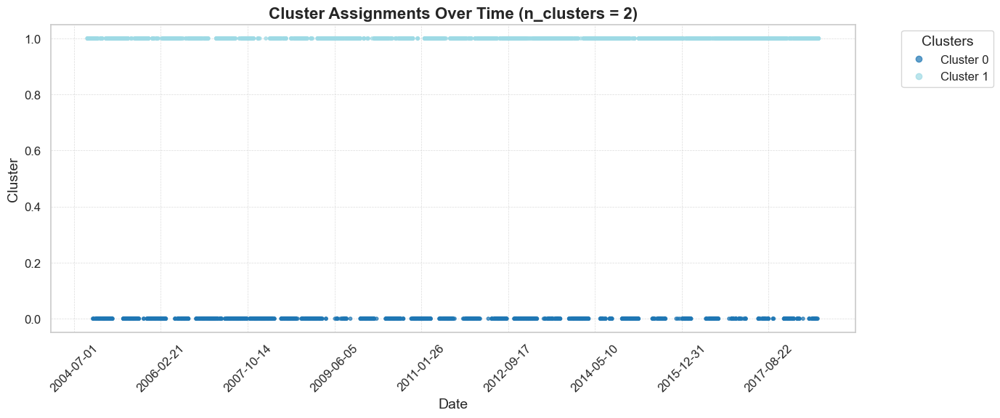

In [109]:
# List of K values to compare
k_values = [2]

for n_clusters in k_values:

    kmeans = KMeans(n_clusters=n_clusters, random_state=42)

    cluster_labels = kmeans.fit_predict(df_scale)

    pivot_df['Cluster'] = cluster_labels

    pivot_df.index = pd.to_datetime(pivot_df.index)


    color_palette = plt.get_cmap('tab20').colors[:n_clusters]

    plt.figure(figsize=(14, 6))

    scatter = plt.scatter(
        pivot_df.index, 
        pivot_df['Cluster'], 
        c=cluster_labels, 
        cmap='tab20',
        s=10,
        alpha=0.7
    )

    handles, _ = scatter.legend_elements(prop="colors", alpha=0.7)
    legend_labels = [f'Cluster {i}' for i in range(n_clusters)]
    plt.legend(handles, legend_labels, title='Clusters', title_fontsize=14, fontsize=12, bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.xlabel('Date', fontsize=14)
    plt.ylabel('Cluster', fontsize=14)
    plt.title(f'Cluster Assignments Over Time (n_clusters = {n_clusters})', fontsize=16, fontweight='bold')
    plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)

    plt.gca().xaxis.set_major_locator(plt.MaxNLocator(10))
    plt.xticks(rotation=45, fontsize=12)
    plt.yticks(fontsize=12)

    plt.tight_layout()
    plt.show()

    # Remove 'Cluster' column for next iteration
    pivot_df = pivot_df.drop('Cluster', axis=1)



# **Visualization for t-sne and PCA**

## PCA

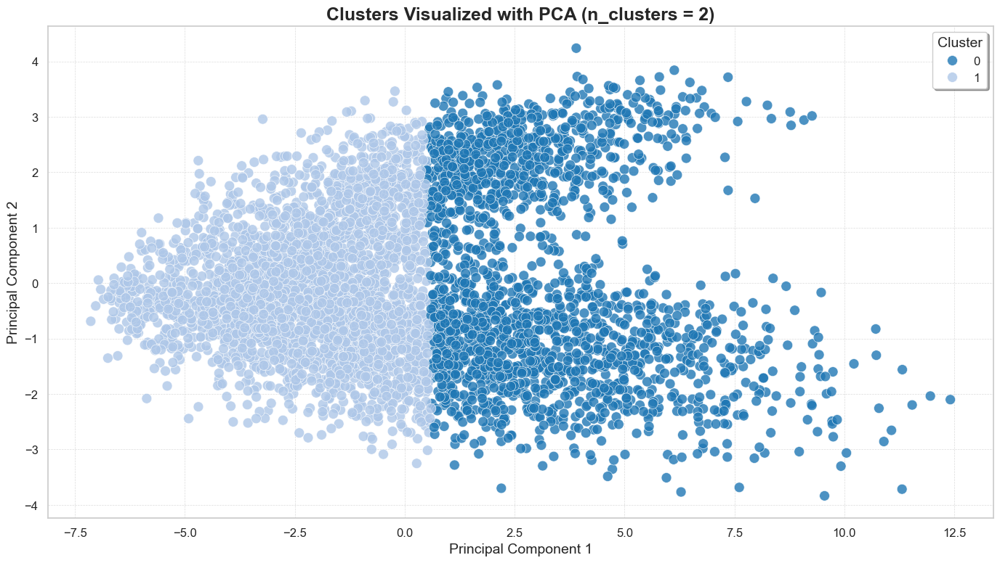

In [110]:
# List of K values to compare
k_values = [2]

df_scale.columns = df_scale.columns.astype(str)

for n_clusters in k_values:

    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(df_scale)

    # PCA reduces data to 2 dimensions
    pca = PCA(n_components=2)
    principal_components = pca.fit_transform(df_scale)

    # Create a DataFrame for plotting
    pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])
    pca_df['Cluster'] = cluster_labels

    color_palette = plt.get_cmap('tab20').colors[:n_clusters]
    cluster_colors = {i: color_palette[i] for i in range(n_clusters)}

    plt.figure(figsize=(14, 8))
    scatter = sns.scatterplot(
        x='PC1',
        y='PC2',
        hue='Cluster',
        data=pca_df,
        palette=cluster_colors,
        s=100,                   
        alpha=0.8,               
        edgecolor='w',           
        linewidth=0.5
    )

    plt.title(f'Clusters Visualized with PCA (n_clusters = {n_clusters})', fontsize=18, fontweight='bold')
    plt.xlabel('Principal Component 1', fontsize=14)
    plt.ylabel('Principal Component 2', fontsize=14)
    plt.legend(
        title='Cluster',
        title_fontsize=14,
        fontsize=12,
        loc='upper right',
        frameon=True,
        fancybox=True,
        shadow=True
    )
    plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.tight_layout()
    plt.show()




### t-SNE

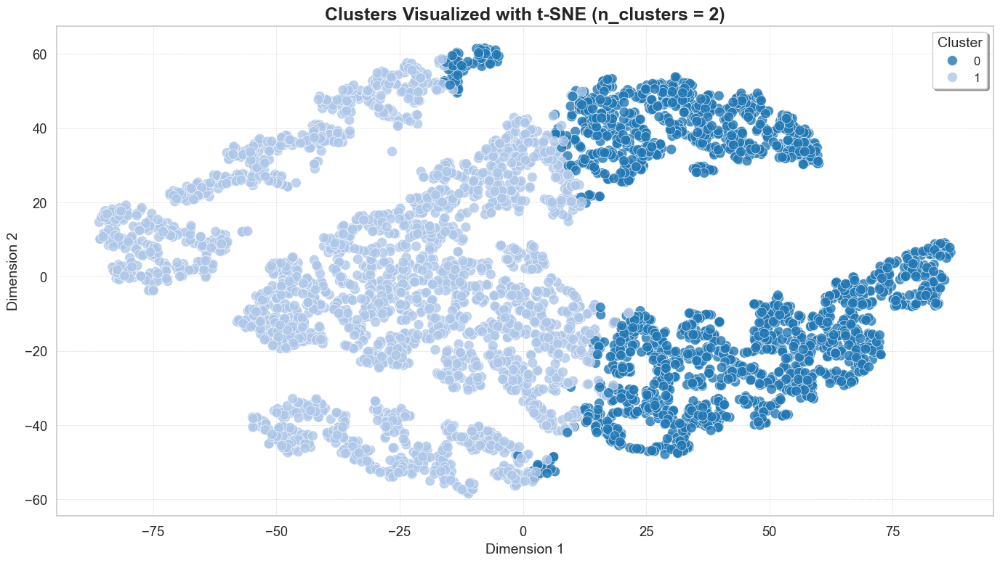

In [111]:
k_values = [2]

for n_clusters in k_values:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(df_scale)
    df_scale['Cluster'] = cluster_labels
    df_scale_no_cluster = df_scale.drop('Cluster', axis=1)
    tsne = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42)
    X_tsne = tsne.fit_transform(df_scale_no_cluster)
    tsne_df = pd.DataFrame(data=X_tsne, columns=['Dim1', 'Dim2'])
    tsne_df['Cluster'] = cluster_labels
    color_palette = plt.get_cmap('tab20').colors[:n_clusters]
    plt.figure(figsize=(14, 8))
    sns.scatterplot(
        x='Dim1',
        y='Dim2',
        hue='Cluster',
        data=tsne_df,
        palette=color_palette,
        s=100,
        alpha=0.8,
        edgecolor='w',
        linewidth=0.5
    )
    plt.title(f'Clusters Visualized with t-SNE (n_clusters = {n_clusters})', fontsize=18, fontweight='bold')
    plt.xlabel('Dimension 1', fontsize=14)
    plt.ylabel('Dimension 2', fontsize=14)
    plt.legend(title='Cluster', title_fontsize=14, fontsize=12, loc='upper right', frameon=True, fancybox=True, shadow=True)
    plt.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
    plt.tight_layout()
    plt.show()
    df_scale = df_scale.drop('Cluster', axis=1)


# **Analysis**

### Identify Weekdays vs. Weekends

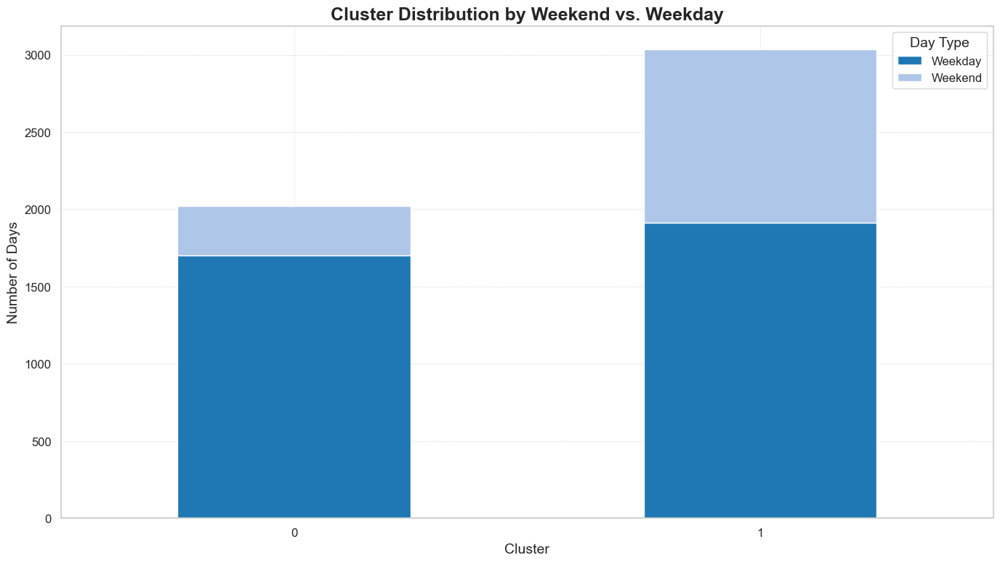

In [112]:
# Ensuring 'Cluster' column is in pivot_df
pivot_df['Cluster'] = cluster_labels

# Ensuring 'Date' column is datetime
pivot_df.index = pd.to_datetime(pivot_df.index)
pivot_df['Date'] = pivot_df.index

# Adding 'DayOfWeek' column
pivot_df['DayOfWeek'] = pivot_df['Date'].dt.dayofweek

# Adding 'IsWeekend' column
pivot_df['IsWeekend'] = pivot_df['DayOfWeek'].apply(lambda x: 1 if x >= 5 else 0)

# Cross-tabulation of clusters by weekend vs. weekday
weekend_cluster_counts = pd.crosstab(pivot_df['Cluster'], pivot_df['IsWeekend'])

color_palette = plt.get_cmap('tab20').colors[:weekend_cluster_counts.shape[0]]

plt.figure(figsize=(14, 8))
weekend_cluster_counts.plot(
    kind='bar',
    stacked=True,
    color=color_palette,
    ax=plt.gca()
)
plt.title('Cluster Distribution by Weekend vs. Weekday', fontsize=18, fontweight='bold')
plt.xlabel('Cluster', fontsize=14)
plt.ylabel('Number of Days', fontsize=14)
plt.legend(['Weekday', 'Weekend'], title='Day Type', title_fontsize=14, fontsize=12)
plt.xticks(rotation=0, fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
plt.tight_layout()
plt.show()


### Identify month cluster distribution 

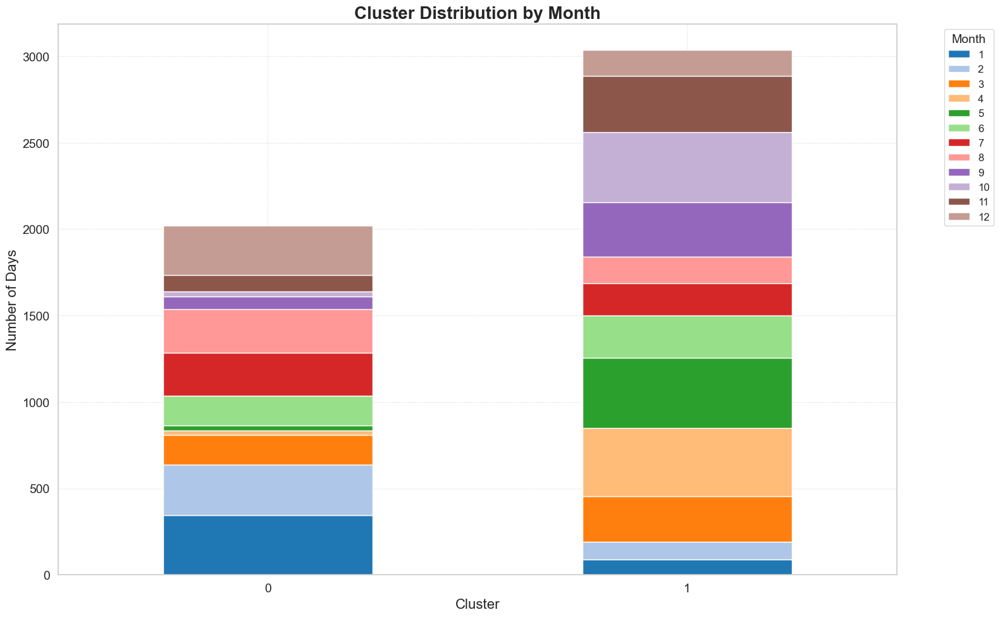

In [113]:
# Add 'Month' column
pivot_df['Month'] = pivot_df['Date'].dt.month

# Cross-tabulation of clusters by month
month_cluster_counts = pd.crosstab(pivot_df['Cluster'], pivot_df['Month'])


color_palette = sns.color_palette("tab20", n_colors=month_cluster_counts.shape[1])
# Plot the distribution
plt.figure(figsize=(16, 10))
month_cluster_counts.plot(
    kind='bar',
    stacked=True,
    color=color_palette,
    ax=plt.gca()
)
plt.title('Cluster Distribution by Month', fontsize=20, fontweight='bold')
plt.xlabel('Cluster', fontsize=16)
plt.ylabel('Number of Days', fontsize=16)
plt.legend(title='Month', title_fontsize=14, fontsize=12, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=0, fontsize=14)
plt.yticks(fontsize=14)
plt.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
plt.tight_layout()
plt.show()


### Identify quarter cluster distribution 

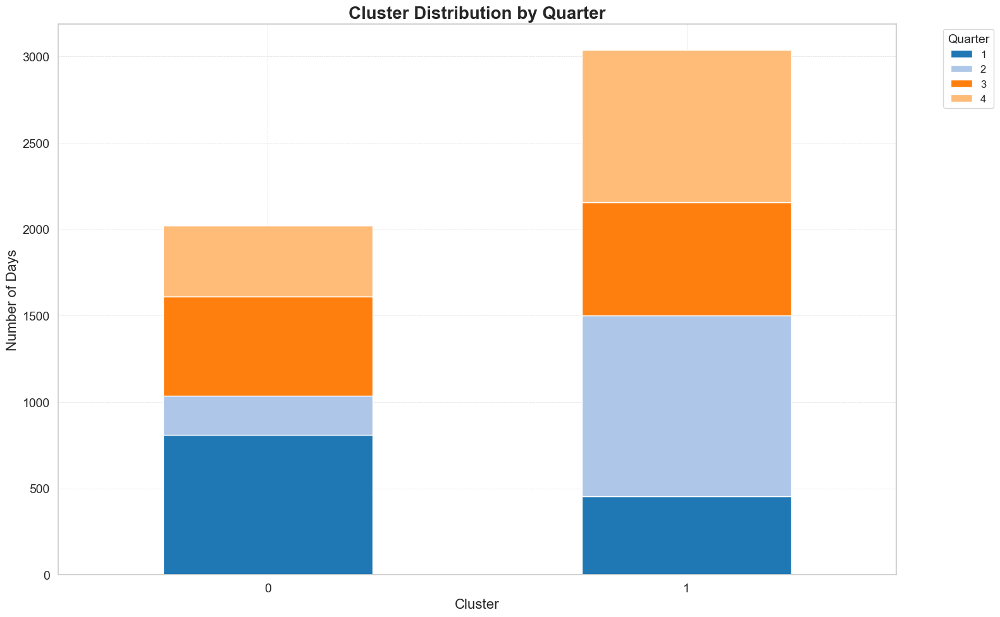

In [114]:
# Add 'Month' column
pivot_df['Quarter'] = pivot_df['Date'].dt.quarter


# Cross-tabulation of clusters by month
month_cluster_counts = pd.crosstab(pivot_df['Cluster'], pivot_df['Quarter'])


color_palette = sns.color_palette("tab20", n_colors=month_cluster_counts.shape[1])
# Plot the distribution
plt.figure(figsize=(16, 10))
month_cluster_counts.plot(
    kind='bar',
    stacked=True,
    color=color_palette,
    ax=plt.gca()
)
plt.title('Cluster Distribution by Quarter', fontsize=20, fontweight='bold')
plt.xlabel('Cluster', fontsize=16)
plt.ylabel('Number of Days', fontsize=16)
plt.legend(title='Quarter', title_fontsize=14, fontsize=12, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=0, fontsize=14)
plt.yticks(fontsize=14)
plt.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
plt.tight_layout()
plt.show()

### Statistical Analysis

In [115]:

hour_columns = [col for col in pivot_df.columns if col not in ['Date', 'Cluster']]

# Compute summary statistics for each cluster
cluster_stats = pivot_df.groupby('Cluster')[hour_columns].agg(['mean', 'median', 'var'])

# Display the statistics
print("Summary Statistics for Each Cluster:")
print(cluster_stats)

Summary Statistics for Each Cluster:
Hour                0                                    1           \
                 mean   median           var          mean   median   
Cluster                                                               
0        16480.573151  16248.0  2.016579e+06  15677.088658  15428.0   
1        13434.616664  13422.5  1.102497e+06  12704.314559  12655.0   

Hour                              2                                    3  ...  \
                  var          mean   median           var          mean  ...   
Cluster                                                                   ...   
0        2.218930e+06  15193.206538  14916.0  2.577819e+06  14928.047548  ...   
1        9.899637e+05  12261.692194  12193.5  9.912380e+05  12024.236495  ...   

Hour    DayOfWeek IsWeekend                      Month                    \
              var      mean median       var      mean median        var   
Cluster                                          

### Representing cluster 0  and 1 with time periods over 4 time periods (morning, afternoon, evening and night)

Average Energy Consumption per Cluster for Different Time Periods:
        Morning     Afternoon       Evening         Night
1  14059.552811   15130.74753  15158.338768  12405.193484
0  17363.529883  18513.758791  18650.765395  15353.348275


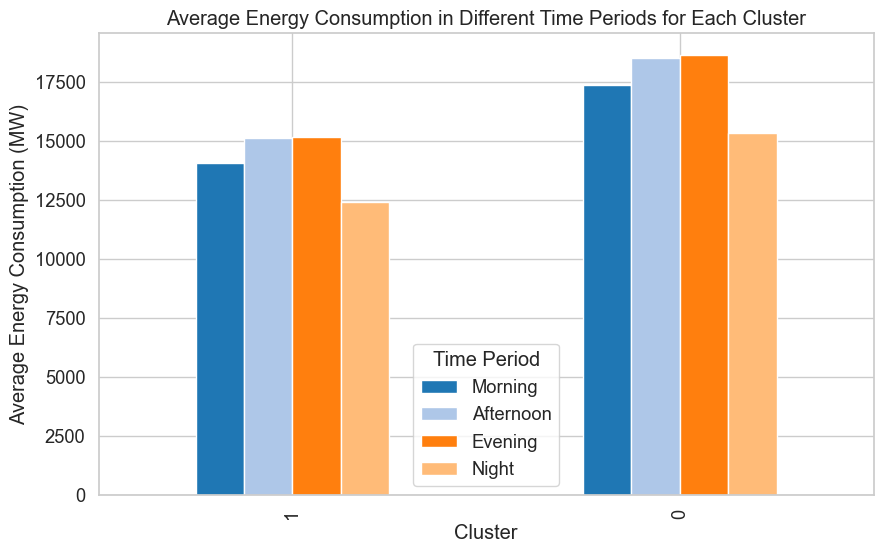

In [116]:
df = pd.read_csv('E:/Assignments/Unsupervisied/Data/AEP_hourly/AEP_hourly.csv')


df['Datetime'] = pd.to_datetime(df['Datetime'])
df['Date'] = df['Datetime'].dt.date
df['Hour'] = df['Datetime'].dt.hour

pivot_df = df.pivot_table(values='AEP_MW', index='Date', columns='Hour')

# filling and dropping missing values
pivot_df.fillna(method='ffill', inplace=True)
pivot_df.fillna(method='bfill', inplace=True)
pivot_df.dropna(inplace=True)

# Normalization and using RobustScaler for Outliers
scaler = RobustScaler()
scaled_data = scaler.fit_transform(pivot_df)

kmeans = KMeans(n_clusters=2, random_state=42) 
pivot_df['Cluster'] = kmeans.fit_predict(scaled_data)

# Defining time in hours for morning, afternoon, evening and night
morning_hours = [6, 7, 8, 9, 10, 11]
afternoon_hours = [12, 13, 14, 15, 16, 17]
evening_hours = [18, 19, 20, 21, 22, 23]
night_hours = [0, 1, 2, 3, 4, 5]

# Calculate average consumption for each cluster during different times of the day
time_periods = {
    'Morning': morning_hours,
    'Afternoon': afternoon_hours,
    'Evening': evening_hours,
    'Night': night_hours
}

cluster_time_analysis = pd.DataFrame(index=pivot_df['Cluster'].unique(), columns=time_periods.keys())

# calculate the average consumption in each period
for cluster in cluster_time_analysis.index:
    for period, hours in time_periods.items():
        available_hours = [hour for hour in hours if hour in pivot_df.columns]
        if available_hours:
            cluster_time_analysis.loc[cluster, period] = pivot_df[pivot_df['Cluster'] == cluster][available_hours].mean().mean()


print("Average Energy Consumption per Cluster for Different Time Periods:")
print(cluster_time_analysis)

# Plotting periods analysis
cluster_time_analysis.plot(kind='bar', figsize=(10, 6))
plt.title('Average Energy Consumption in Different Time Periods for Each Cluster')
plt.xlabel('Cluster')
plt.ylabel('Average Energy Consumption (MW)')
plt.legend(title='Time Period')
plt.grid(True)
plt.show()



### Weekends and Weekdays avg. energy usage

Weekend Cluster Analysis (high afternoon usage expected):
Cluster
0    17596.212121
1    14406.352148
dtype: float64

Weekday Cluster Analysis (morning peak expected):
Cluster
0    17508.454412
1    14611.509506
dtype: float64
Weekend Cluster Analysis (high afternoon usage expected):
Cluster
0    16591.204807
1    13121.962370
dtype: float64

Weekday Cluster Analysis (morning peak expected):
Cluster
0    18685.933725
1    15557.196930
dtype: float64


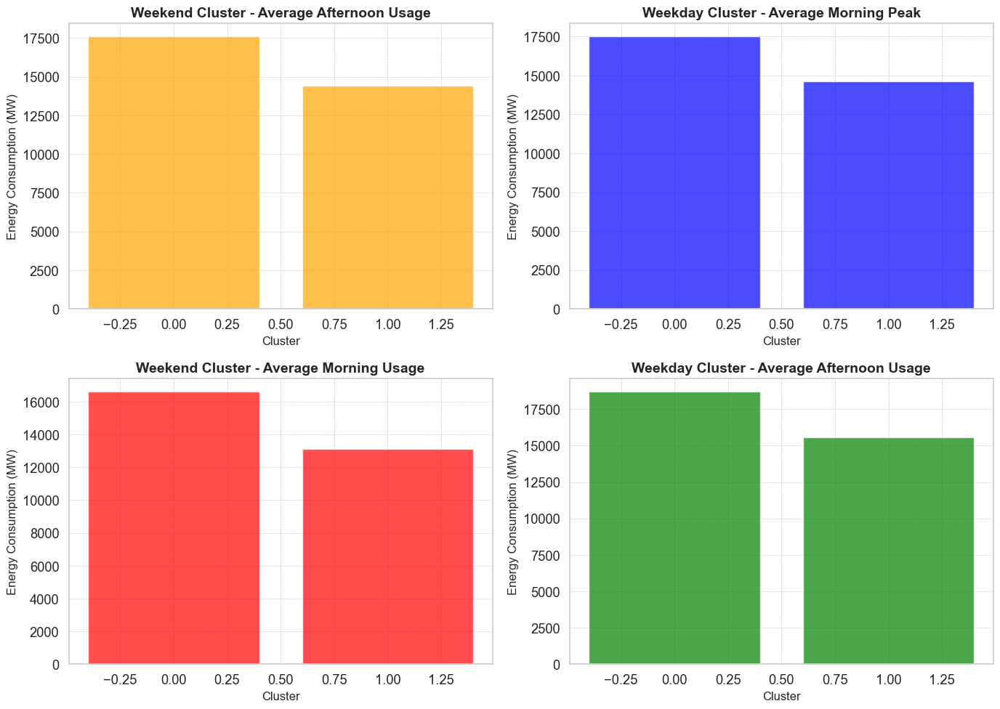

In [117]:
# Data Preparation (adding dayofweek)
df['DayOfWeek'] = pd.to_datetime(df['Datetime']).dt.dayofweek


# Merge back the day of the week to analyze weekends and weekdays
pivot_df = pivot_df.reset_index()
pivot_df = pd.merge(pivot_df, df[['Date', 'DayOfWeek']].drop_duplicates(), on='Date', how='left')

# Define the time periods that will be used
morning_hours = [6, 7, 8, 9, 10, 11] 
afternoon_hours = [12, 13, 14, 15, 16, 17]

# weekends
pivot_df['IsWeekend'] = pivot_df['DayOfWeek'].apply(lambda x: 1 if x >= 5 else 0)

# Calculating avg. consumption for weekends and weekdays
weekend_cluster = pivot_df[pivot_df['IsWeekend'] == 1].groupby('Cluster').mean(numeric_only=True)
weekday_cluster = pivot_df[pivot_df['IsWeekend'] == 0].groupby('Cluster').mean(numeric_only=True)


print("Weekend Cluster Analysis (high afternoon usage expected):")
weekend_afternoon_mean = weekend_cluster[afternoon_hours].mean(axis=1)
print(weekend_afternoon_mean)

print("\nWeekday Cluster Analysis (morning peak expected):")
weekday_morning_mean = weekday_cluster[morning_hours].mean(axis=1)
print(weekday_morning_mean)

print("Weekend Cluster Analysis (high afternoon usage expected):")
weekend_morning_mean = weekend_cluster[morning_hours].mean(axis=1)
print(weekend_morning_mean)

print("\nWeekday Cluster Analysis (morning peak expected):")
weekday_afternoon_mean = weekday_cluster[afternoon_hours].mean(axis=1)
print(weekday_afternoon_mean)

# Data for each subplot
data = [
    (weekend_afternoon_mean, 'Weekend Cluster - Average Afternoon Usage', 'orange'),
    (weekday_morning_mean, 'Weekday Cluster - Average Morning Peak', 'blue'),
    (weekend_morning_mean, 'Weekend Cluster - Average Morning Usage', 'red'),
    (weekday_afternoon_mean, 'Weekday Cluster - Average Afternoon Usage', 'green')
]
# Creating a 2x2 grid
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
for i in range(2):
    for j in range(2):
        idx = i * 2 + j
        mean_data, title, color = data[idx]
        
        axes[i, j].bar(mean_data.index, mean_data, color=color, alpha=0.7)
        
        axes[i, j].set_title(title, fontsize=14, fontweight='bold')
        axes[i, j].set_xlabel('Cluster', fontsize=12)
        axes[i, j].set_ylabel('Energy Consumption (MW)', fontsize=12)
        axes[i, j].grid(True, linestyle='--', linewidth=0.5)

plt.tight_layout()
plt.show()



### Quarters avg. energy usage

Quarter Cluster Analysis (high afternoon usage expected):
Quarter  Cluster
1        0          17767.890947
         1          14732.038263
2        0          19376.971852
         1          15118.265173
3        0          20096.041883
         1          16159.743747
4        0          17277.770270
         1          14587.926599
dtype: float64

Quarter Cluster Analysis (high morning usage expected):
Quarter  Cluster
1        0          18621.739095
         1          15019.803164
2        0          15854.502963
         1          13702.763902
3        0          15881.397458
         1          13419.606687
4        0          17794.910729
         1          14464.959137
dtype: float64


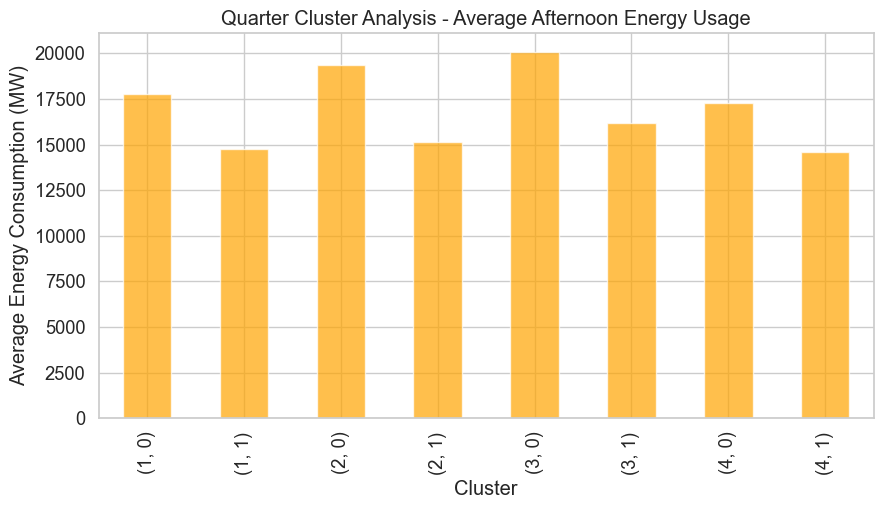

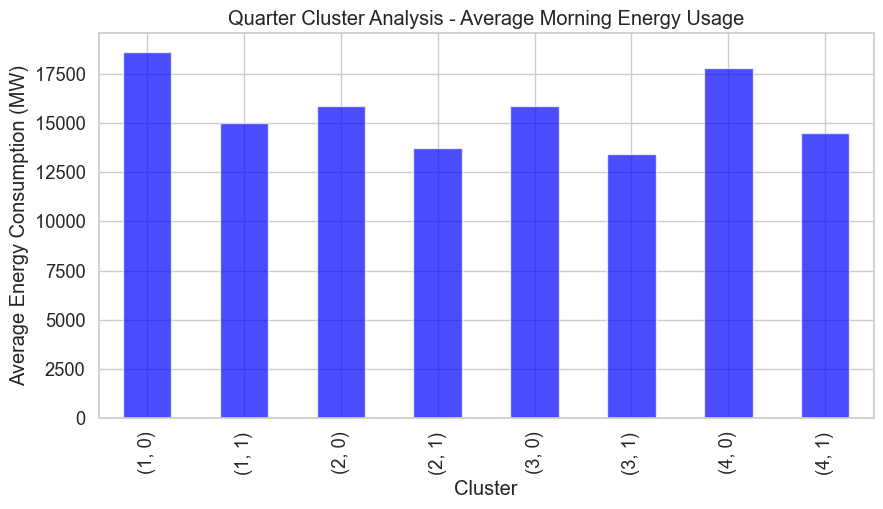

In [118]:
# Data Preparation (adding quarter)
df['Quarter'] = df['Datetime'].dt.quarter

pivot_df = pivot_df.reset_index()
pivot_df = pd.merge(pivot_df, df[['Date', 'Quarter']].drop_duplicates(), on='Date', how='left')

morning_hours = [6, 7, 8, 9, 10, 11]
afternoon_hours = [12, 13, 14, 15, 16, 17]

# Analyze by Quarter and Cluster
quarter_cluster = pivot_df.groupby(['Quarter', 'Cluster']).mean(numeric_only=True)

print("Quarter Cluster Analysis (high afternoon usage expected):")
quarter_afternoon_mean = quarter_cluster[afternoon_hours].mean(axis=1)
print(quarter_afternoon_mean)

print("\nQuarter Cluster Analysis (high morning usage expected):")
quarter_morning_mean = quarter_cluster[morning_hours].mean(axis=1)
print(quarter_morning_mean)

# Plot Quarter (Afternoon usage)
plt.figure(figsize=(10, 5))
quarter_afternoon_mean.plot(kind='bar', color='orange', alpha=0.7)
plt.title('Quarter Cluster Analysis - Average Afternoon Energy Usage')
plt.xlabel('Cluster')
plt.ylabel('Average Energy Consumption (MW)')
plt.grid(True)
plt.show()

# Plot Quarter (Morning peak usage)
plt.figure(figsize=(10, 5))
quarter_morning_mean.plot(kind='bar', color='blue', alpha=0.7)
plt.title('Quarter Cluster Analysis - Average Morning Energy Usage')
plt.xlabel('Cluster')
plt.ylabel('Average Energy Consumption (MW)')
plt.grid(True)
plt.show()


### Months avg. energy usage

Month Cluster Analysis (high afternoon usage expected):
Quarter  Cluster
1        0          17767.890947
         1          14732.038263
2        0          19376.971852
         1          15118.265173
3        0          20096.041883
         1          16159.743747
4        0          17277.770270
         1          14587.926599
dtype: float64

Month Cluster Analysis (high morning usage expected):
Quarter  Cluster
1        0          18621.739095
         1          15019.803164
2        0          15854.502963
         1          13702.763902
3        0          15881.397458
         1          13419.606687
4        0          17794.910729
         1          14464.959137
dtype: float64


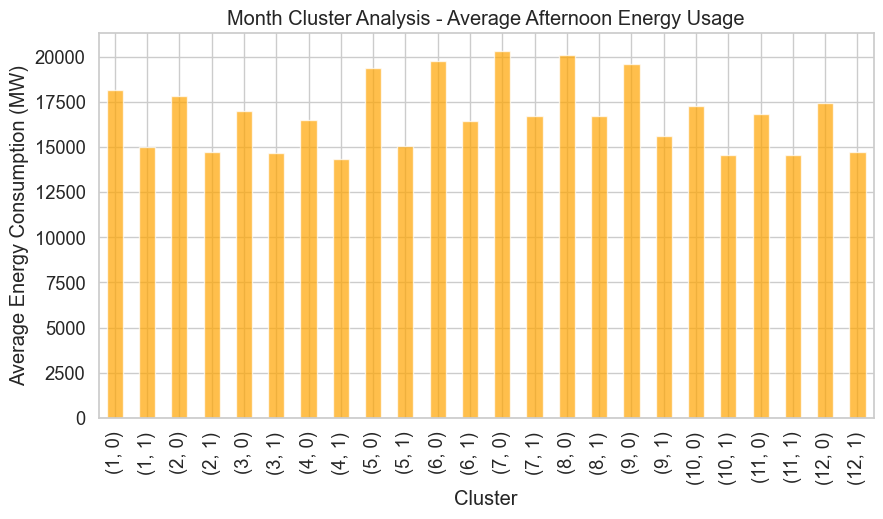

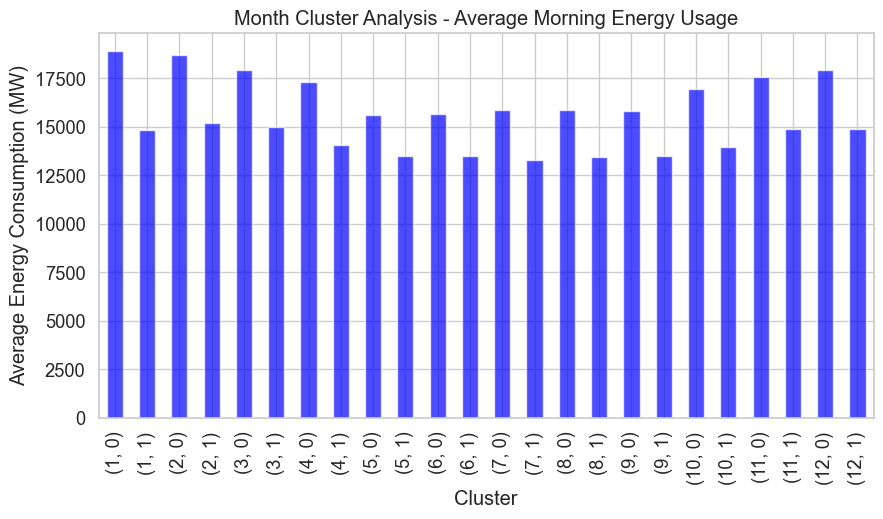

In [119]:
# Data preperation (adding month)
df['Month'] = df['Datetime'].dt.month

pivot_df = pivot_df.reset_index()
pivot_df = pd.merge(pivot_df, df[['Date', 'Month']].drop_duplicates(), on='Date', how='left')

morning_hours = [6, 7, 8, 9, 10, 11]
afternoon_hours = [12, 13, 14, 15, 16, 17]

month_cluster = pivot_df.groupby(['Month', 'Cluster']).mean(numeric_only=True)

print("Month Cluster Analysis (high afternoon usage expected):")
month_afternoon_mean = month_cluster[afternoon_hours].mean(axis=1)
print(quarter_afternoon_mean)

print("\nMonth Cluster Analysis (high morning usage expected):")
month_morning_mean = month_cluster[morning_hours].mean(axis=1)
print(quarter_morning_mean)

# Plot months (Afternoon usage)
plt.figure(figsize=(10, 5))
month_afternoon_mean.plot(kind='bar', color='orange', alpha=0.7)
plt.title('Month Cluster Analysis - Average Afternoon Energy Usage')
plt.xlabel('Cluster')
plt.ylabel('Average Energy Consumption (MW)')
plt.grid(True)
plt.show()

# Plot months (Morning peak usage)
plt.figure(figsize=(10, 5))
month_morning_mean.plot(kind='bar', color='blue', alpha=0.7)
plt.title('Month Cluster Analysis - Average Morning Energy Usage')
plt.xlabel('Cluster')
plt.ylabel('Average Energy Consumption (MW)')
plt.grid(True)
plt.show()


# Different clustering algorithms to see if they perform better than K-means

In [120]:
if 'Cluster' in df_scale.columns:
    df_scale = df_scale.drop('Cluster', axis=1)

df_scale.columns = df_scale.columns.astype(str)

X = df_scale.copy()

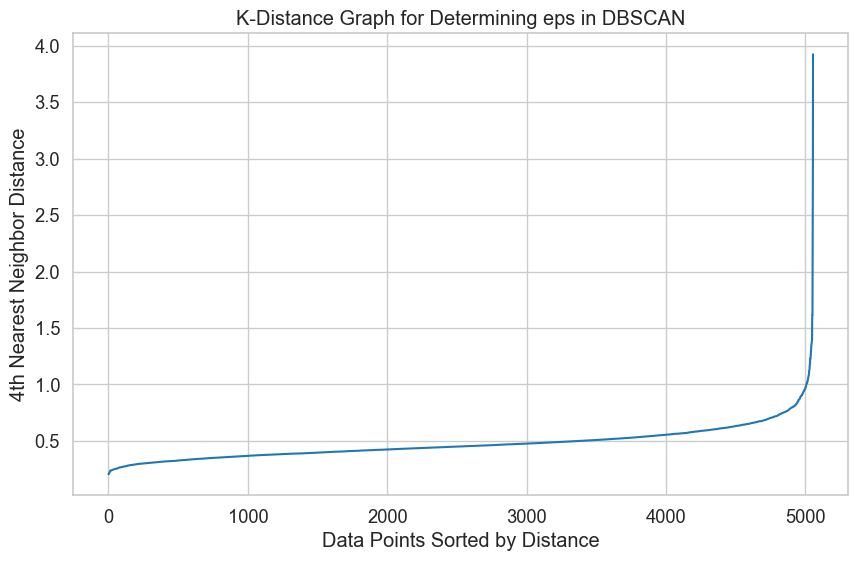

In [121]:
# Compute the nearest neighbors
neighbors = NearestNeighbors(n_neighbors=5)
neighbors_fit = neighbors.fit(X)
distances, indices = neighbors_fit.kneighbors(X)

# Sort the distances
distances = np.sort(distances[:, 4])

plt.figure(figsize=(10, 6))
plt.plot(distances)
plt.title('K-Distance Graph for Determining eps in DBSCAN')
plt.xlabel('Data Points Sorted by Distance')
plt.ylabel('4th Nearest Neighbor Distance')
plt.grid(True)
plt.show()

### DBSCAN

In [122]:
# Apply DBSCAN
dbscan = DBSCAN(eps=0.65, min_samples=10)
dbscan_labels = dbscan.fit_predict(X)

# Number of clusters (excluding noise if label == -1)
n_clusters_dbscan = len(set(dbscan_labels)) - (1 if -1 in dbscan_labels else 0)
print(f"Estimated number of clusters from DBSCAN: {n_clusters_dbscan}")

# Filter out noise points for silhouette score
mask = dbscan_labels != -1
if n_clusters_dbscan > 1:
    silhouette_avg = silhouette_score(X[mask], dbscan_labels[mask])
    print(f"Silhouette Score for DBSCAN: {silhouette_avg:.4f}")
else:
    print("DBSCAN did not find more than one cluster.")


Estimated number of clusters from DBSCAN: 3
Silhouette Score for DBSCAN: 0.3963


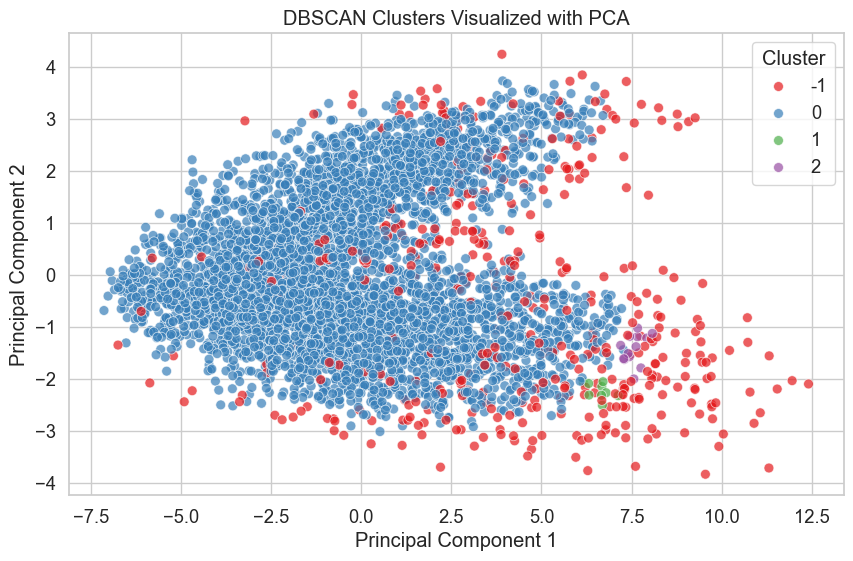

In [123]:
# Perform PCA for visualization
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X)

# Create a DataFrame for plotting
dbscan_df = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2'])
dbscan_df['Cluster'] = dbscan_labels

# Plot the clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(x='PC1', y='PC2', hue='Cluster', data=dbscan_df, palette='Set1', s=50, alpha=0.7)
plt.title('DBSCAN Clusters Visualized with PCA')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster', loc='best')
plt.grid(True)
plt.show()


### Agglomerative Clustering

In [124]:
# Apply Agglomerative Clustering with Ward linkage
agglo = AgglomerativeClustering(n_clusters=3, linkage='complete')
agglo_labels = agglo.fit_predict(X)

# Compute silhouette score
silhouette_avg = silhouette_score(X, agglo_labels)
print(f"Silhouette Score for Agglomerative Clustering (Ward linkage): {silhouette_avg:.4f}")


Silhouette Score for Agglomerative Clustering (Ward linkage): 0.3837


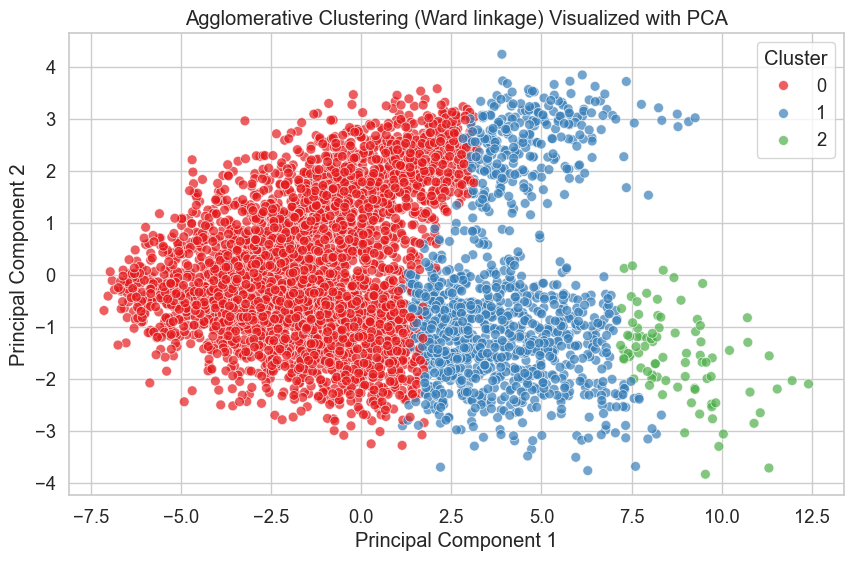

In [125]:
# Perform PCA for visualization
X_pca = pca.fit_transform(X)

# Create a DataFrame for plotting
agglo_df = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2'])
agglo_df['Cluster'] = agglo_labels

# Plot the clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(x='PC1', y='PC2', hue='Cluster', data=agglo_df, palette='Set1', s=50, alpha=0.7)
plt.title('Agglomerative Clustering (Ward linkage) Visualized with PCA')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster', loc='best')
plt.grid(True)
plt.show()


### GMM (Gaussian Mixture Model)

Silhouette Score for GMM: 0.1558


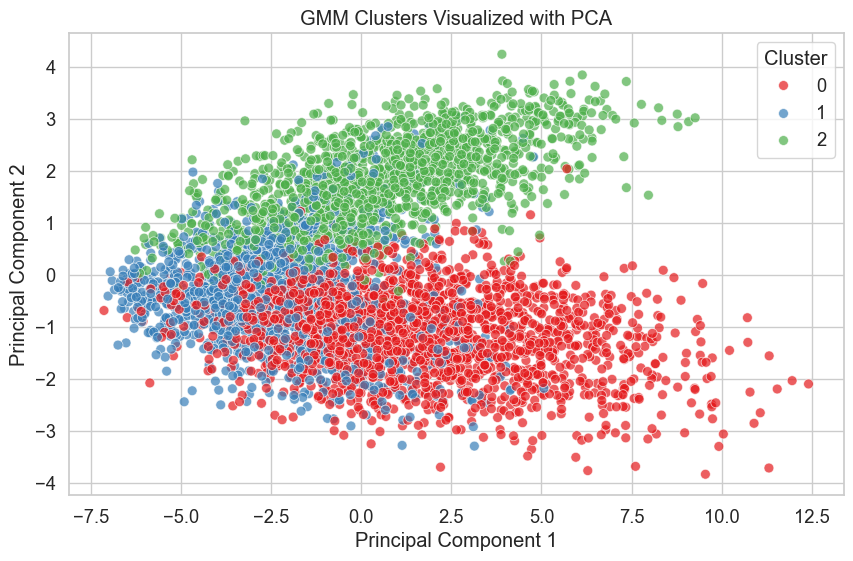

In [126]:
# Apply GMM
gmm = GaussianMixture(n_components=3, random_state=42)
gmm_labels = gmm.fit_predict(X)

# Compute silhouette score
silhouette_avg = silhouette_score(X, gmm_labels)
print(f"Silhouette Score for GMM: {silhouette_avg:.4f}")


# Perform PCA for visualization
X_pca = pca.fit_transform(X)

# Create a DataFrame for plotting
gmm_df = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2'])
gmm_df['Cluster'] = gmm_labels

# Plot the clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(x='PC1', y='PC2', hue='Cluster', data=gmm_df, palette='Set1', s=50, alpha=0.7)
plt.title('GMM Clusters Visualized with PCA')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster', loc='best')
plt.grid(True)
plt.show()


# Compare Performance

In [127]:
# storing scores in dict
silhouette_scores = {}

# K-Means Scores
kmeans_labels = cluster_labels
silhouette_scores['K-Means'] = silhouette_score(X, kmeans_labels)

# DBSCAN Scores
if n_clusters_dbscan > 1:
    silhouette_scores['DBSCAN'] = silhouette_score(X[mask], dbscan_labels[mask])

# Agglomerative Clustering Scores
silhouette_scores['Agglomerative'] = silhouette_score(X, agglo_labels)

# GMM Scores
silhouette_scores['GMM'] = silhouette_score(X, gmm_labels)

# silhouette scores
print("Silhouette Scores:")
for method, score in silhouette_scores.items():
    print(f"{method}: {score:.4f}")

print('Higher Score means better performance')

Silhouette Scores:
K-Means: 0.4447
DBSCAN: 0.3963
Agglomerative: 0.3837
GMM: 0.1558
Higher Score means better performance


# **A summary of findings and insight**

#### The objective of this analysis was to identify distinct energy consumption profiles in the dataset using clustering algorithms. And this happened by dividing the data into clusters to give us meaningful insights. Also, we try to understand the patterns in the consumption data, and this summary will explain the findings and insights got from the analysis.


# **Key Findings and Insights**




#### We started by loading the dataset and importing the necessary packages for the project. The first step in data preparation involved feature engineering a pivot DataFrame that consists of energy consumption values, with 24 columns representing each hour of the day.

#### Next, we checked the dataset for any null values. To handle missing data, we used interpolation methods and then filled any remaining NaN values with the mean. This ensured that our dataset was free from null values, which is crucial for generating accurate insights.

#### We then visualized the average energy consumption per hour to gain a better understanding of the dataset and its trends. Afterward, we normalized the data to eliminate redundancy and address any inconsistencies.

#### We proceeded by plotting a boxplot of the dataset and histograms for each hour. These visualizations helped us identify important patterns and anomalies in the data. Upon reviewing these, it became clear that there were many outliers present in the data.

#### At this stage, we faced a decision on which scaler to use: Standard Scaler, Min-Max Scaler, or Robust Scaler. To assist in this decision, we plotted boxplots for the dataset after applying each scaler and found that Robust Scaler performed best, as it handles outliers more efficiently.

#### With the data normalized and prepared, we implemented the K-Means clustering algorithm. We used the Elbow method to determine the optimal value of k (the number of clusters). Based on the graph, we identified that the best value of k was 3.

#### After selecting the optimal k, we fitted the K-Means model, predicted the clusters, and added a new column called "clusters" to both the scaled DataFrame and the original DataFrame. We then calculated the cluster centers and used these to plot the average daily profiles for each cluster. Additional visualizations, such as pie charts and bar charts, were also created to further illustrate these findings.

#### To explore the effects of different k values, we conducted a comparison between k=3 and k=4. We visualized the results using PCA, heatmaps, average daily profiles, and cluster distribution over time graphs. This allowed us to see the differences between these k values and assess which one was more effective in defining meaningful clusters.

#### Next, we advanced our methods by using the silhouette score to determine the optimal k value. We repeated the process for the new optimal k, again visualizing the results with PCA, heatmaps, average daily profiles, and cluster distribution graphs.

#### To further enhance our visualizations, we applied both t-SNE and PCA techniques.

#### We then analyzed the data based on different time periods, including weekdays vs. weekends, months, and quarters. This allowed us to better understand how energy consumption varied across these different dimensions. Additionally, we plotted the energy usage for specific time periods (morning, afternoon, evening, and night) and visualized the differences in energy usage between weekdays and weekends, as well as across months and quarters.

#### Finally, we experimented with alternative clustering algorithms, including GMM (Gaussian Mixture Model), Agglomerative Clustering, and DBSCAN, to see if they could outperform K-Means. While these algorithms yielded good results, none surpassed K-Means in terms of producing high-quality insights from the dataset.

#### This process allowed us to thoroughly explore the data and extract meaningful insights about energy consumption patterns.